In [1]:
from scipy.io import loadmat
import mne
# Load the file
data = loadmat(r"C:\Users\10346\PythonPrograms/BCI/ERD/s01.mat")

# Check the keys in the dataset
print(data.keys())


dict_keys(['__header__', '__version__', '__globals__', 'eeg'])


In [2]:
import numpy as np
import pandas as pd

# Extract EEG structure
eeg_data = data['eeg'][0, 0]

# Extract relevant fields
movement_left = eeg_data['movement_left']  # (68, 71,680)
movement_right = eeg_data['movement_right']  # (68, 71,680)
movement_event = eeg_data['movement_event']  # (1, 71,680)

imagery_left = eeg_data['imagery_left']  # (68, 358,400)
imagery_right = eeg_data['imagery_right']  # (68, 358,400)
imagery_event = eeg_data['imagery_event']  # (1, 358,400)

sampling_rate = eeg_data['srate'][0, 0]
sensor_location = eeg_data['senloc']
movement_event = eeg_data['movement_event']

In [ ]:
fs = eeg_data_contents['srate'][0, 0]

In [3]:
# Create MNE Raw object (assuming EEG channels are in (channels, time))
info = mne.create_info(ch_names=[f"Ch{i}" for i in range(movement_left.shape[0])], sfreq=sampling_rate, ch_types="eeg")
raw = mne.io.RawArray(movement_left, info)


Creating RawArray with float64 data, n_channels=68, n_times=71680
    Range : 0 ... 71679 =      0.000 ...   139.998 secs
Ready.


Using matplotlib as 2D backend.


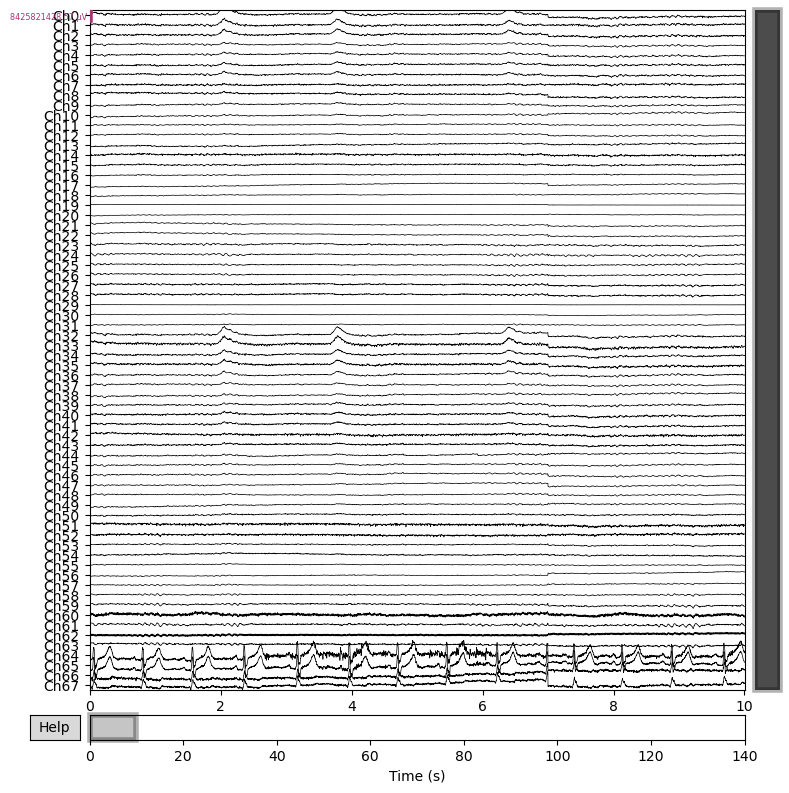

In [4]:
import matplotlib.pyplot as plt
# Plot raw EEG signals
raw.plot(duration=10, n_channels=68, scalings="auto")
plt.show()

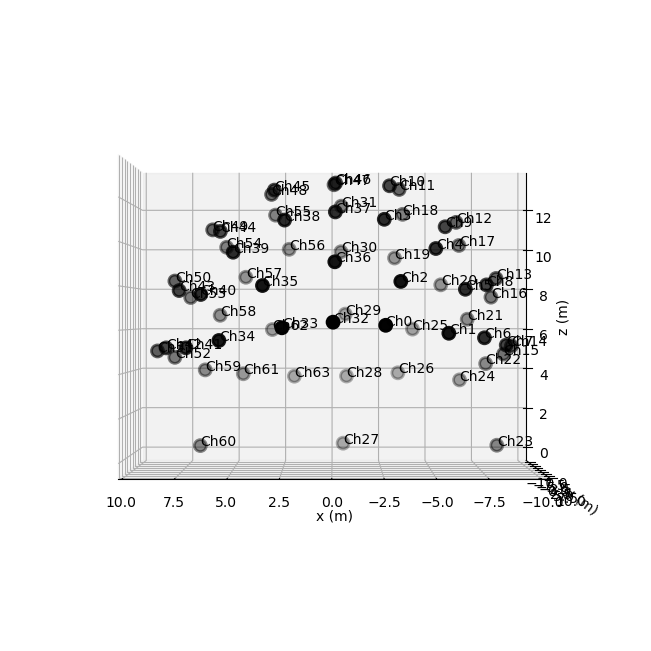

In [5]:
import matplotlib.pyplot as plt

num_channels = sensor_location.shape[0]
ch_names = [f"Ch{i}" for i in range(num_channels)]
montage_dict = {ch: sensor_location[i] for i, ch in enumerate(ch_names)}
montage = mne.channels.make_dig_montage(ch_pos=montage_dict, coord_frame="head")

# Get only the first 64 EEG channels
raw.pick([f"Ch{i}" for i in range(64)])
# Now apply the montage safely
raw.set_montage(montage)

# Plot 3D sensor locations
raw.plot_sensors(kind='3d', show_names=True)

# Show the plot
plt.show()


In [23]:
# pd.DataFrame(movement_left).to_csv("movement_left.csv", index=False)
# pd.DataFrame(movement_right).to_csv("movement_right.csv", index=False)
# pd.DataFrame(movement_event).to_csv("movement_event.csv", index=False)

# pd.DataFrame(imagery_left).to_csv("imagery_left.csv", index=False)
# pd.DataFrame(imagery_right).to_csv("imagery_right.csv", index=False)
# pd.DataFrame(imagery_event).to_csv("imagery_event.csv", index=False)

# print("EEG data extracted and saved successfully!")

EEG data extracted and saved successfully!


In [6]:
#Preprocessing: Remove Bad Channels
eeg_data = raw.get_data()
std_per_channel = np.std(eeg_data, axis=1)

#mean and sd
mean_std = np.mean(std_per_channel)
std_threshold = np.std(std_per_channel)

#Identify bad channels with +-2 SD 
bad_channels = [raw.ch_names[i] for i, std in enumerate(std_per_channel) 
                if std > mean_std + 2 * std_threshold or std < mean_std - 2 * std_threshold]

print("Bad Channels:", bad_channels)

raw.info['bads'] = bad_channels  # mark the bad channels

Bad Channels: ['Ch33', 'Ch46', 'Ch47', 'Ch60']


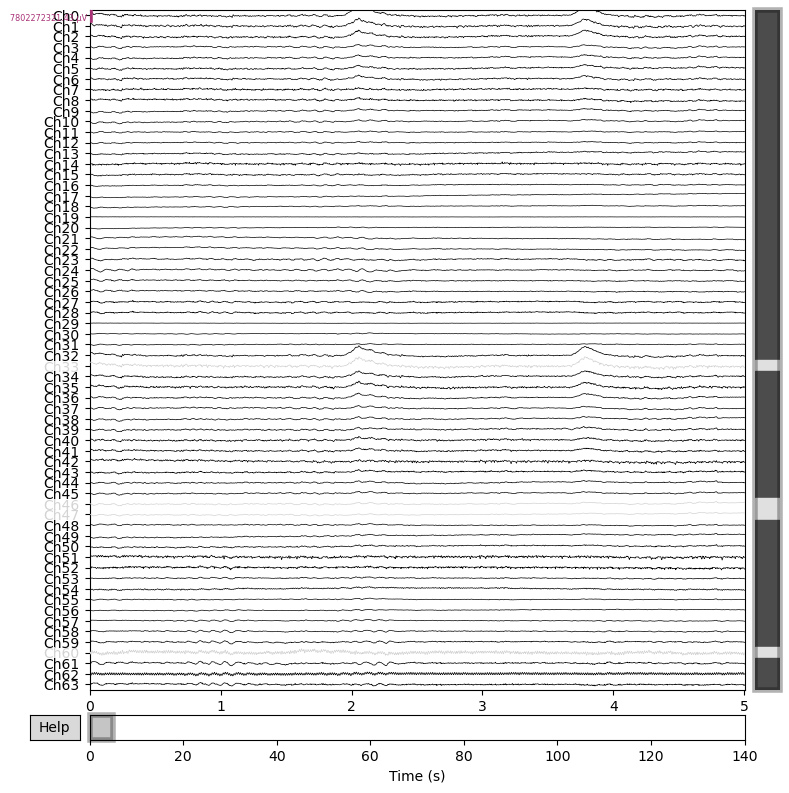

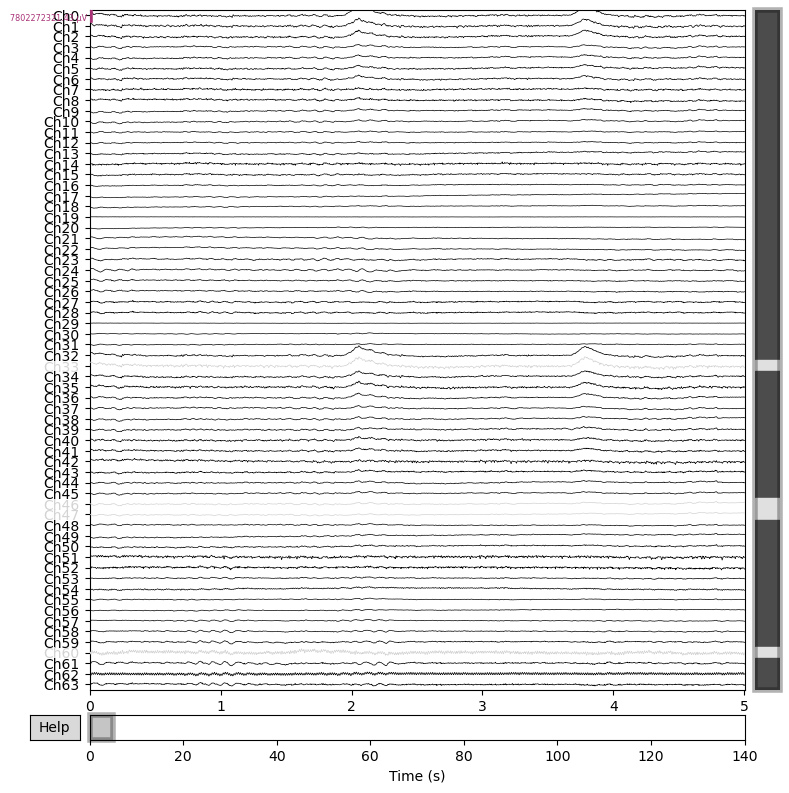

In [7]:
raw.plot(duration=5, n_channels=len(raw.ch_names),scalings='auto')

In [8]:
#Filtering: Apply Band-Pass Filters
raw_copy = raw.copy()
raw_copy.filter(l_freq=1, h_freq=40, fir_design='firwin')

# Downsample the data to 250 Hz
raw_copy.resample(sfreq= 250)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



<RawArray | 64 x 35000 (140.0 s), ~17.2 MiB, data loaded>

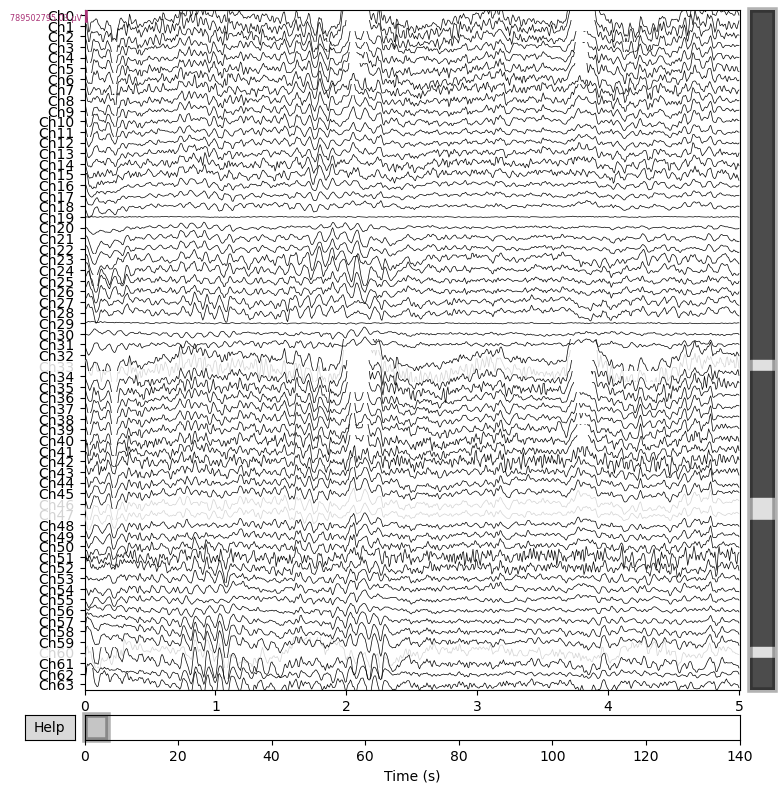

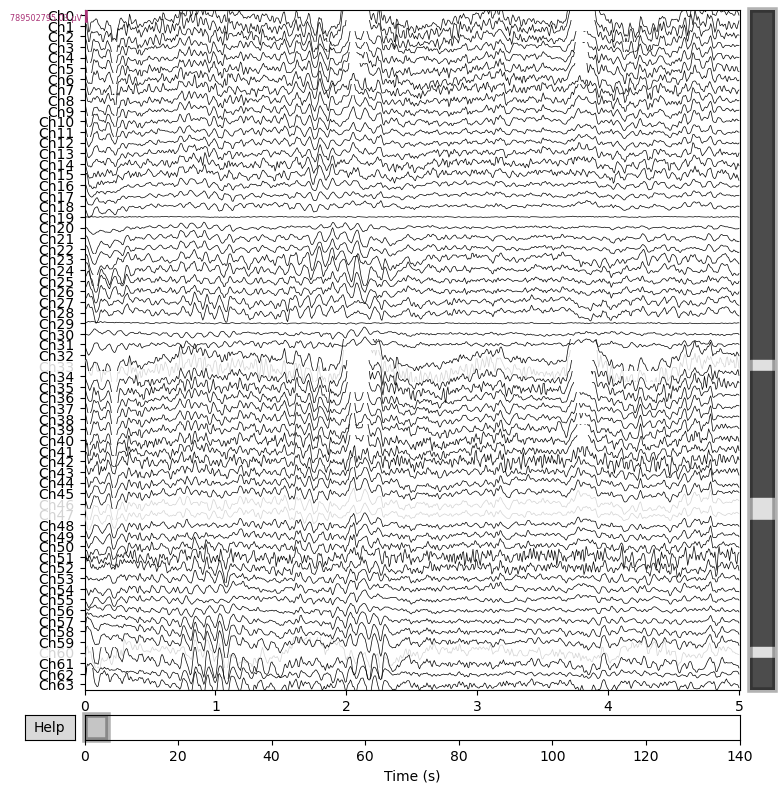

In [10]:
raw_copy.plot(duration=5, n_channels=len(raw.ch_names),scalings='auto')

Not setting metadata
140 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 140 events and 250 original time points ...
0 bad epochs dropped
Using data from preloaded Raw for 140 events and 250 original time points ...
Using data from preloaded Raw for 5 events and 250 original time points ...


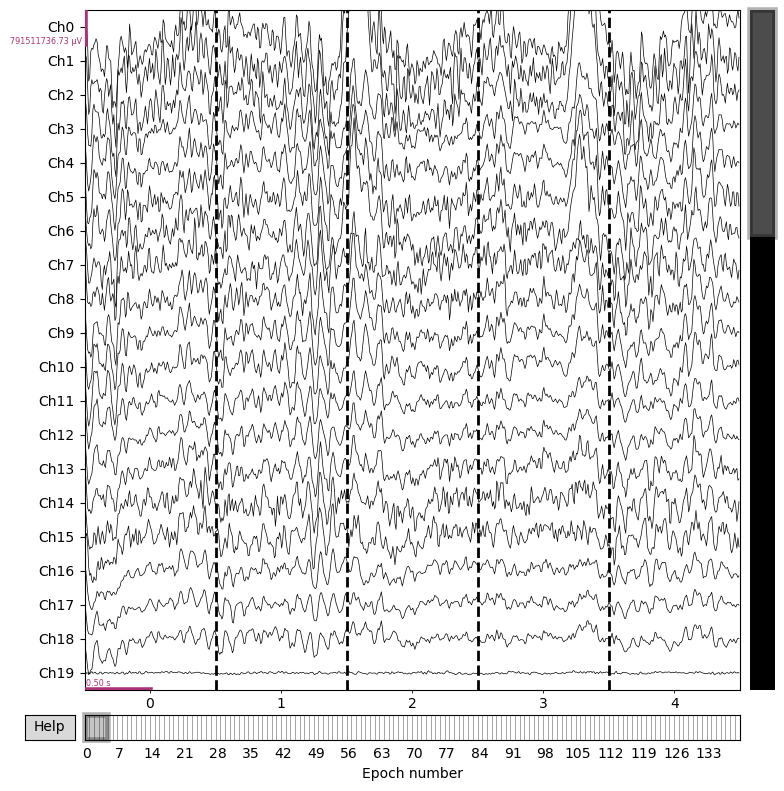

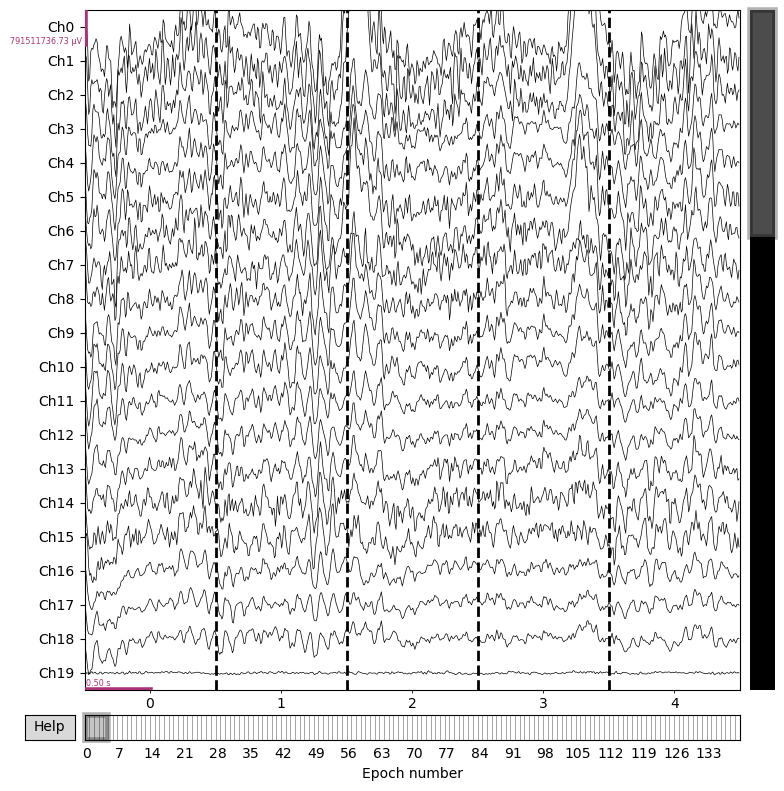

In [12]:
#Epoching: Segment into 1-Second Epochs
epochs = mne.make_fixed_length_epochs(raw_copy, duration=1, preload=False)
# Plot the epochs to inspect them
epochs.plot(n_epochs=5,scalings='auto')

In [ ]:
# # baseline correction
# epochs_copy = epochs.copy()
# baseline = (-2.0, 5.0)
# epochs_copy.apply_baseline(baseline)

In [13]:
# remove epochs contain artifacts
# joint probability
from scipy.stats import zscore

# Extract EEG data from epochs (shape: n_epochs, n_channels, n_timepoints)
epoch_data = epochs.get_data()

# Flatten each epoch into a 1D array for probability calculations
flattened_epochs = epoch_data.reshape(epoch_data.shape[0], -1)

# Compute z-score for each epoch (joint probability)
joint_prob = np.abs(zscore(flattened_epochs, axis=0))  # Compute z-score across epochs

# Identify epochs with extreme values (SD > 3)
bad_epochs_joint_prob = np.where(np.max(joint_prob, axis=1) > 3)[0]

print(f"Bad epochs detected by joint probability: {len(bad_epochs_joint_prob)}")

Using data from preloaded Raw for 140 events and 250 original time points ...
Bad epochs detected by joint probability: 121


In [14]:
# measure of distribution shape using peakness/kurtosis  compared with normal distrubution
from scipy.stats import kurtosis

# Compute kurtosis for each epoch (flattened across all channels and timepoints)
epoch_kurtosis = kurtosis(flattened_epochs, axis=1)

# Compute z-score for kurtosis values
kurtosis_zscore = np.abs(zscore(epoch_kurtosis))

# Identify bad epochs based on kurtosis (SD > 3)
bad_epochs_kurtosis = np.where(kurtosis_zscore > 3)[0]

print(f"Bad epochs detected by kurtosis: {len(bad_epochs_kurtosis)}")

Bad epochs detected by kurtosis: 1


In [15]:
epochs_copy = epochs.copy()

In [ ]:
# drop bad epochs
# bad_epochs = np.unique(np.concatenate((bad_epochs_joint_prob, bad_epochs_kurtosis)))

# print(f"Total bad epochs to remove: {len(bad_epochs)}")

# epochs_copy.drop(bad_epochs, reason="artifact_rejection")


In [16]:
#Independent Component Analysis (ICA) for Artifact Removal
epochs_shape = epochs_copy.get_data().shape
epochs_shape

Using data from preloaded Raw for 140 events and 250 original time points ...


(140, 64, 250)

In [17]:
from mne.preprocessing import ICA

n_components = 60  # channels extrude bad channels
random_state = 42  # Ensures reproducibility

# Initialize ICA model
ica = ICA(n_components=n_components, method='infomax', fit_params=dict(extended=True), random_state=random_state)


In [18]:
# Fit ICA to the raw data
ica.fit(raw)

Fitting ICA to data using 60 channels (please be patient, this may take a while)


C:\Users\10346\AppData\Local\Temp\ipykernel_52316\3818001838.py:2: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(raw)


Selecting by number: 60 components
Computing Extended Infomax ICA
Fitting ICA took 133.6s.


C:\Users\10346\AppData\Local\Temp\ipykernel_52316\3818001838.py:2: RuntimeWarning: Using n_components=60 (resulting in n_components_=60) may lead to an unstable mixing matrix estimation because the ratio between the largest (0.017) and smallest (1.5e-08) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 59
  ica.fit(raw)


Method,infomax
Fit parameters,extended=Truemax_iter=500
Fit,500 iterations on raw data (71680 samples)
ICA components,60
Available PCA components,60
Channel types,eeg
ICA components marked for exclusion,—


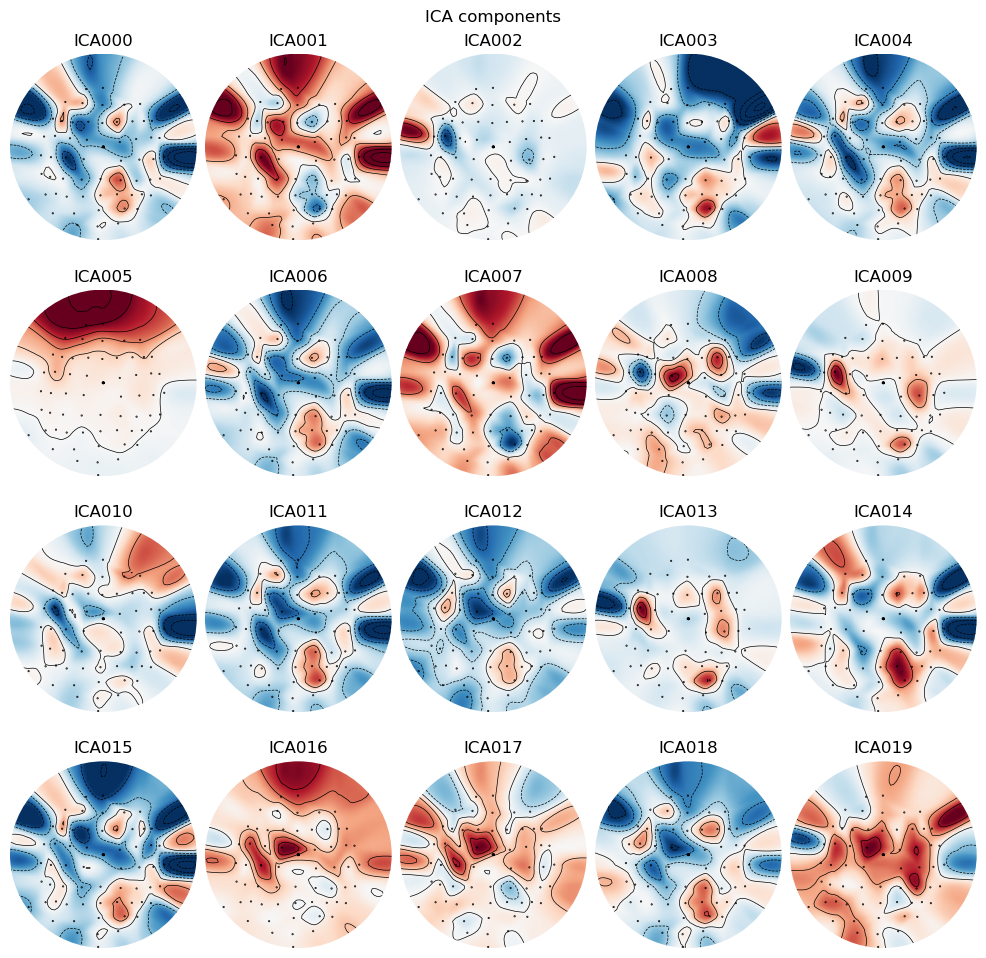

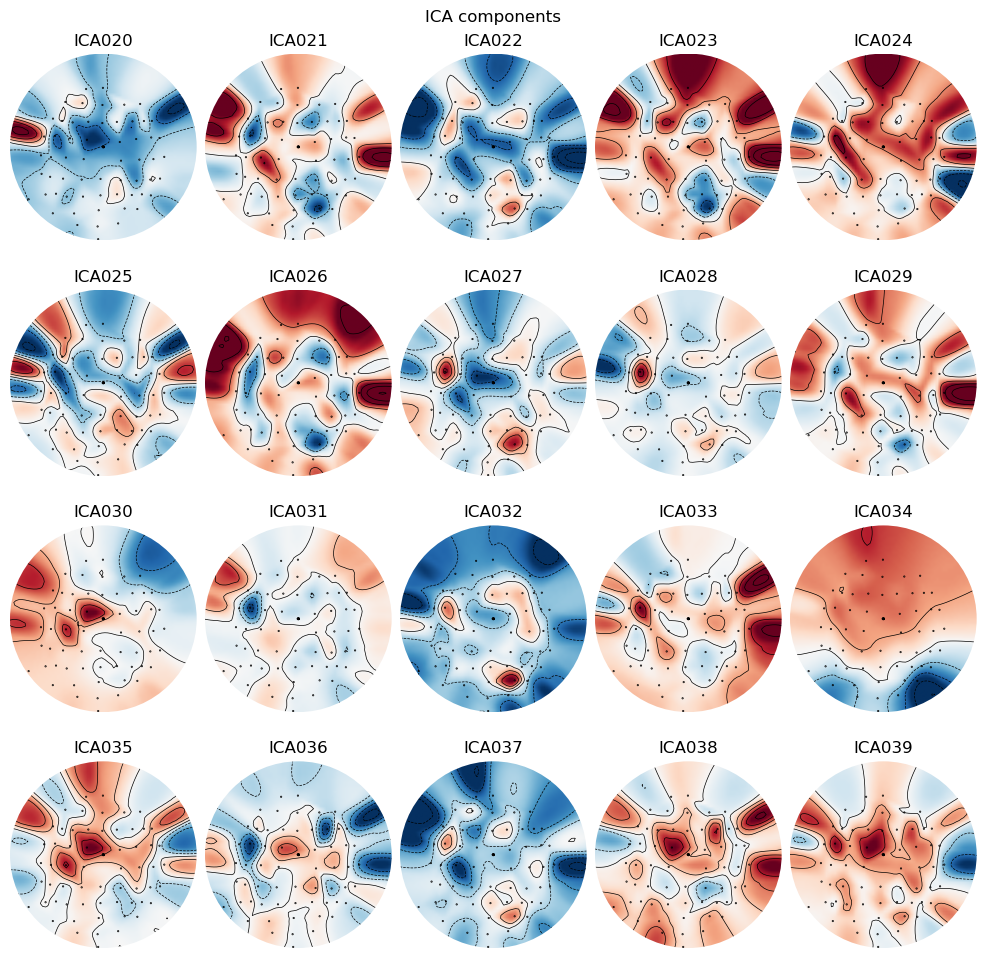

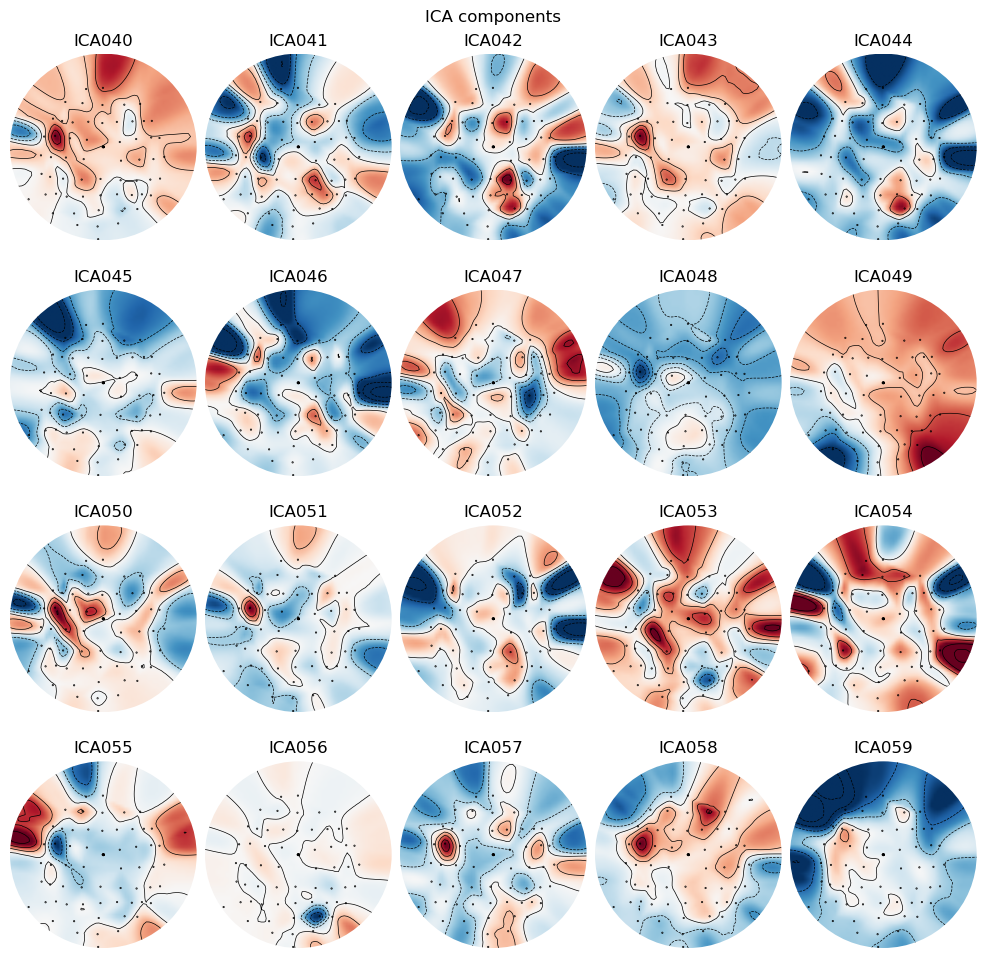

In [19]:
# Plot ICA components (topographies)
ica.plot_components(inst=raw) 
plt.show(block=True)

In [22]:
ica_copy = ica.copy()

Creating RawArray with float64 data, n_channels=2, n_times=71680
    Range : 0 ... 71679 =      0.000 ...   139.998 secs
Ready.


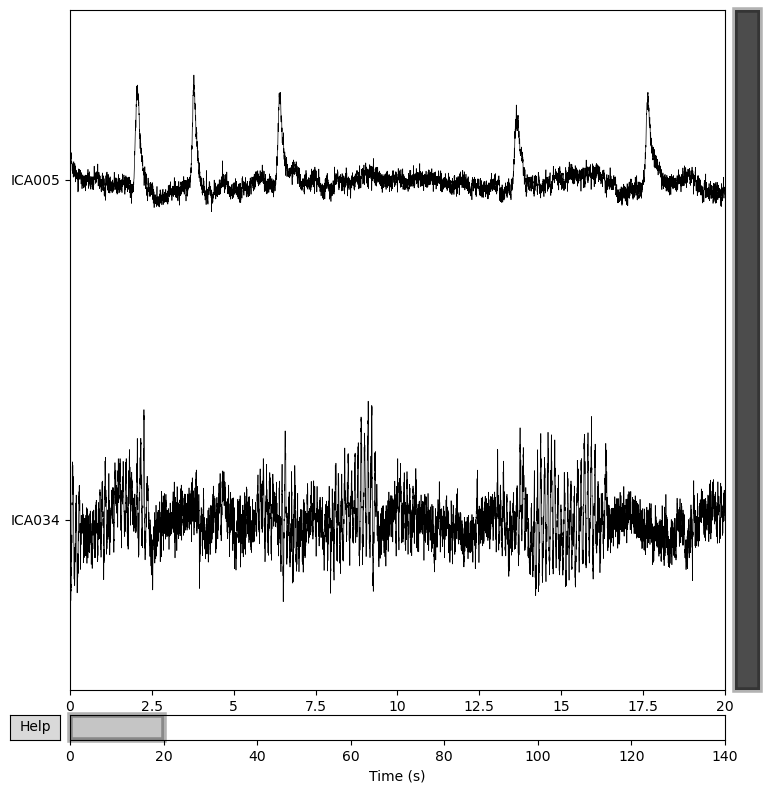

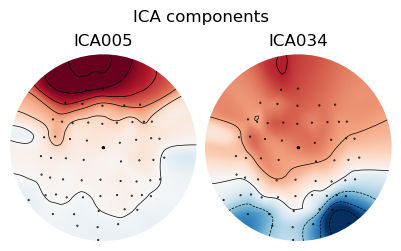

In [23]:
import matplotlib.pyplot as plt

ica.plot_sources(raw, picks=[5, 34])
ica.plot_components(picks=[5, 34])

# Ensure the plots are displayed correctly
plt.show()


In [24]:
# Detect artifact components (eye blinks) based on correlation with EOG channels
# eog_indices, eog_scores = ica_copy.find_bads_eog(raw)
# print("EOG components:", eog_indices)

# # Mark components as bad
# ica_copy.exclude.extend(eog_indices)
ica_copy.exclude = [5, 34]

Applying ICA to Raw instance
    Transforming to ICA space (60 components)
    Zeroing out 2 ICA components
    Projecting back using 60 PCA components


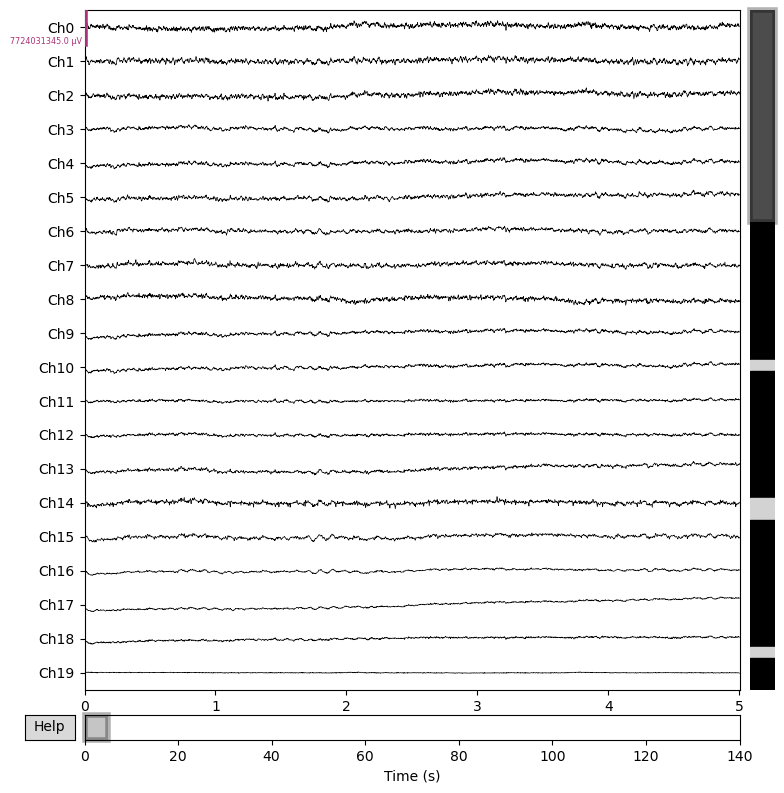

<function matplotlib.pyplot.show(close=None, block=None)>

In [25]:
raw_cleaned = ica_copy.apply(raw.copy())
# Plot EEG after ICA removal
raw_cleaned.plot(duration=5,scalings='auto')
plt.show

Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 227 samples (0.443 s)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 8 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Filter length: 845 samples (1.650 s)



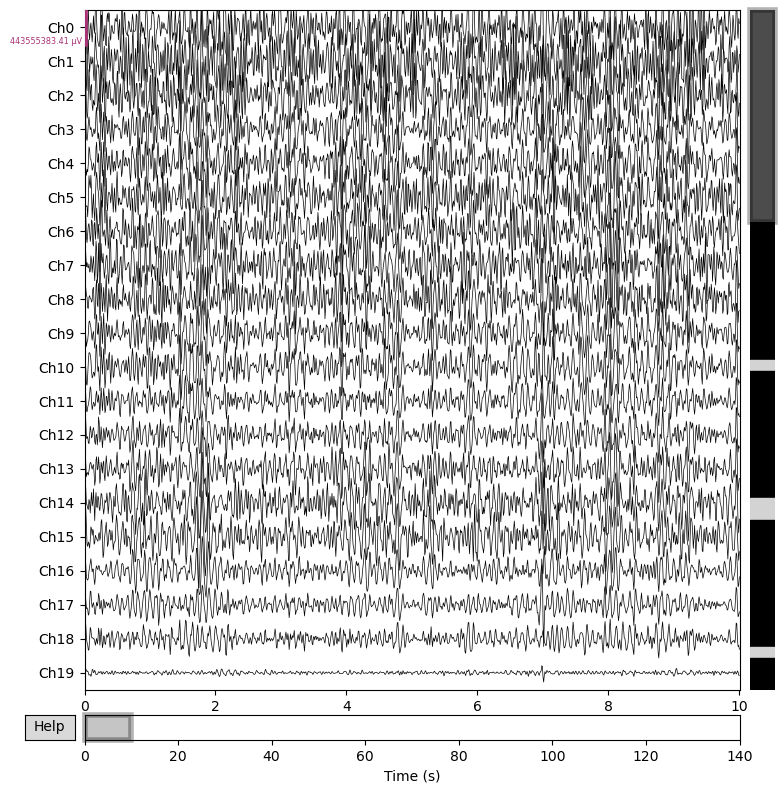

In [26]:
# Apply low-pass filter (30 Hz, FIR, Hamming window, filter order: 220)
raw_cleaned.filter(l_freq=None, h_freq=30, fir_design='firwin', fir_window='hamming', phase='zero', filter_length='auto')

# Apply high-pass filter (8 Hz, FIR, Hamming window, filter order: 826)
raw_cleaned.filter(l_freq=8, h_freq=None, fir_design='firwin', fir_window='hamming', phase='zero', filter_length='auto')

# Plot the filtered cleaned EEG data
raw_cleaned.plot(title="Filtered EEG After ICA",scalings='auto')
plt.show()

Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).


C:\Users\10346\anaconda3\envs\BCI\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


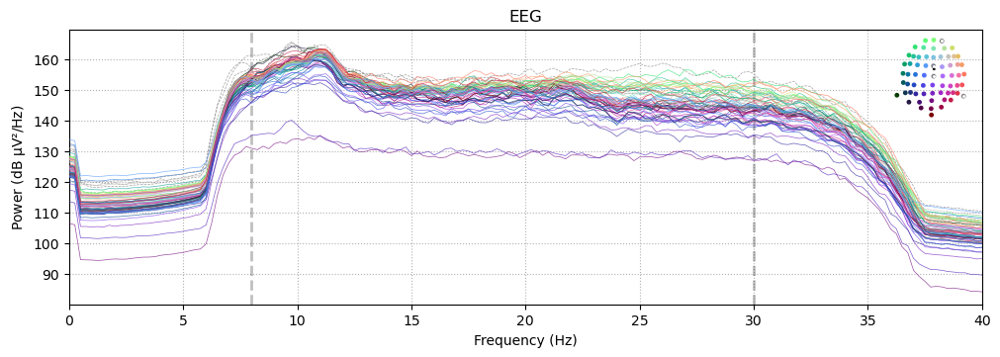

In [27]:
# Compute the PSD within the frequency range of 0 to 40 Hz
psd = raw_cleaned.compute_psd(fmin=0, fmax=40)

# Plot the PSD (MNE handles frequency range internally)
psd.plot()


Plotting PSD for channel: Ch0
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


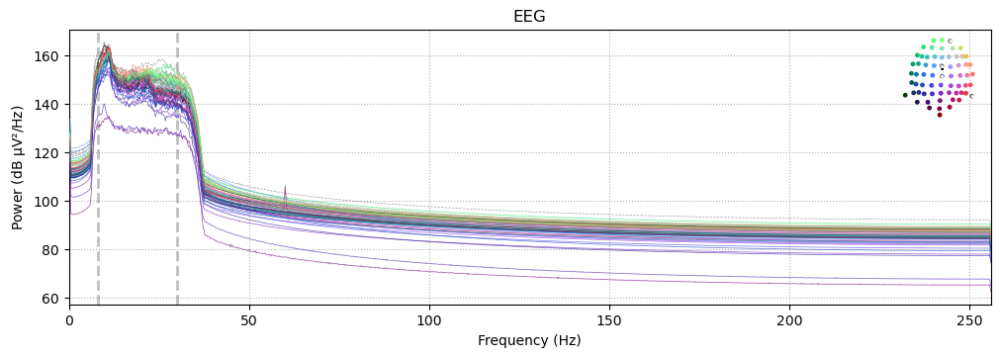

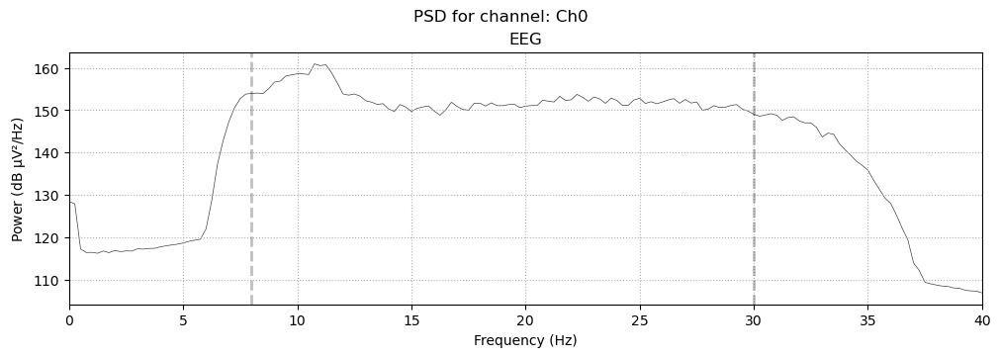

Plotting PSD for channel: Ch1
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


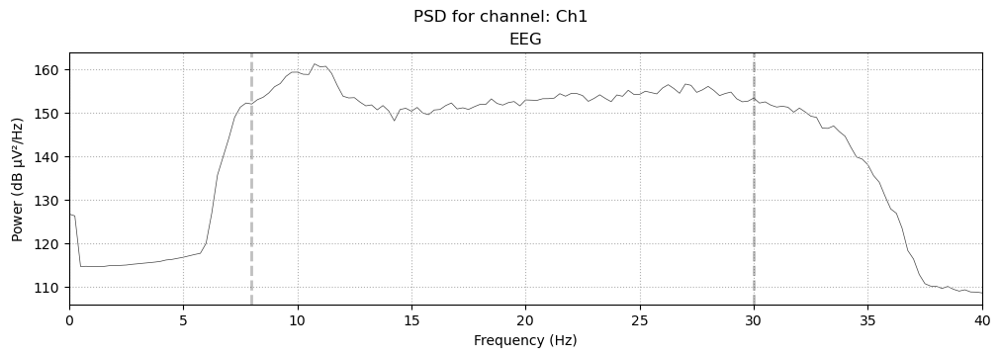

Plotting PSD for channel: Ch2
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


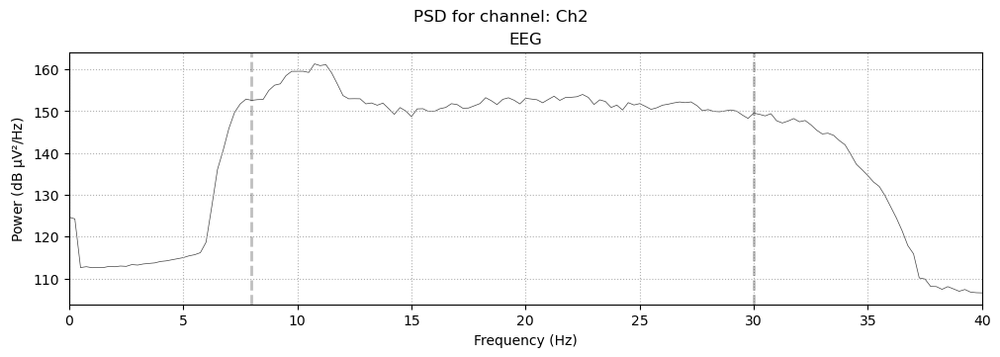

Plotting PSD for channel: Ch3
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


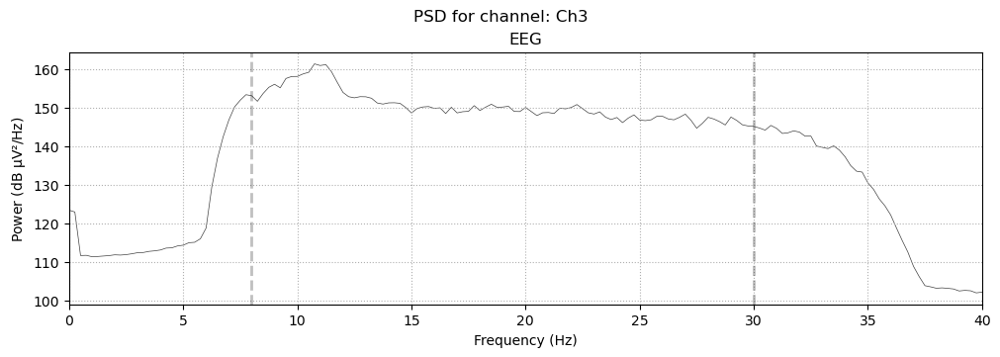

Plotting PSD for channel: Ch4
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


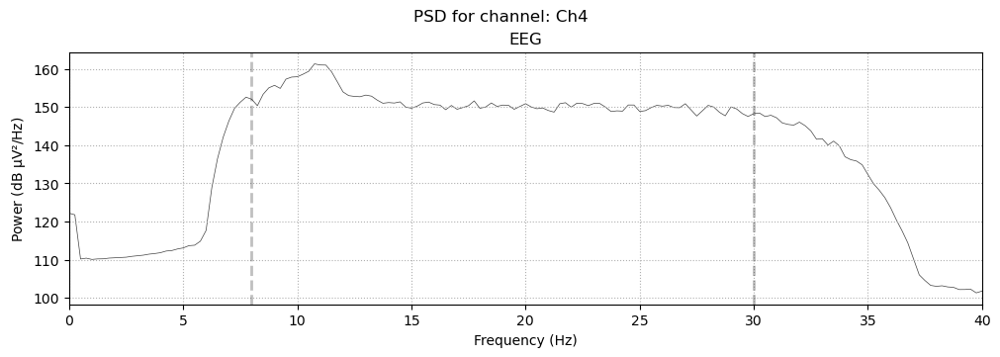

Plotting PSD for channel: Ch5
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


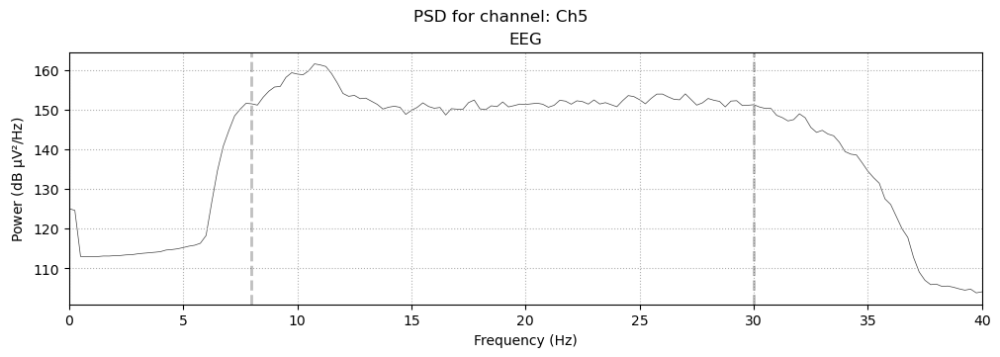

Plotting PSD for channel: Ch6
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


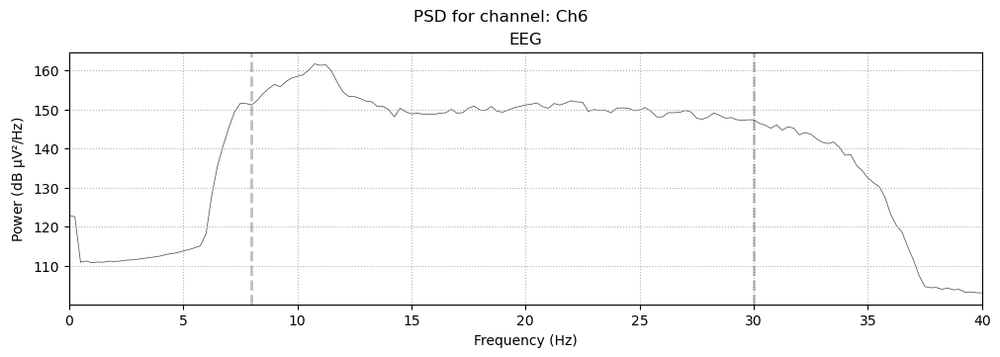

Plotting PSD for channel: Ch7
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


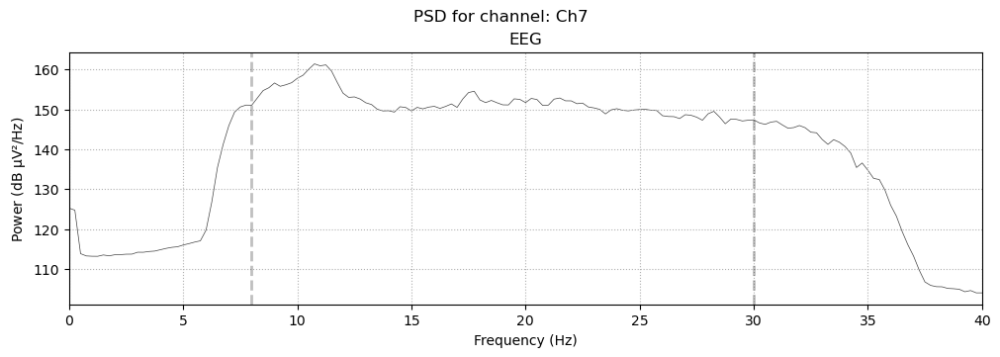

Plotting PSD for channel: Ch8
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


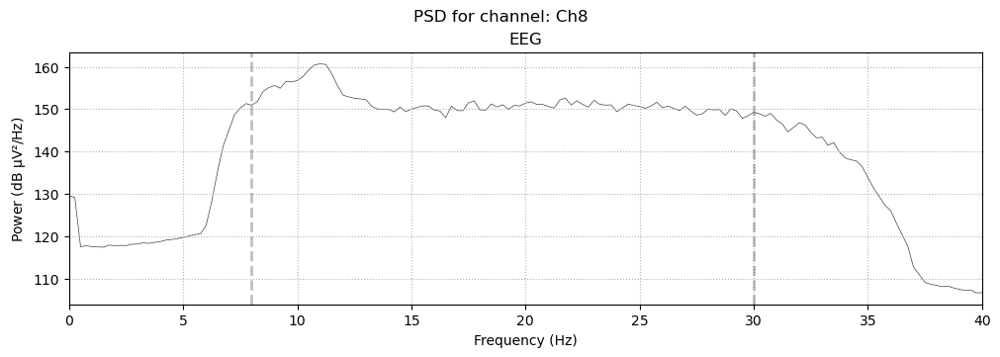

Plotting PSD for channel: Ch9
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


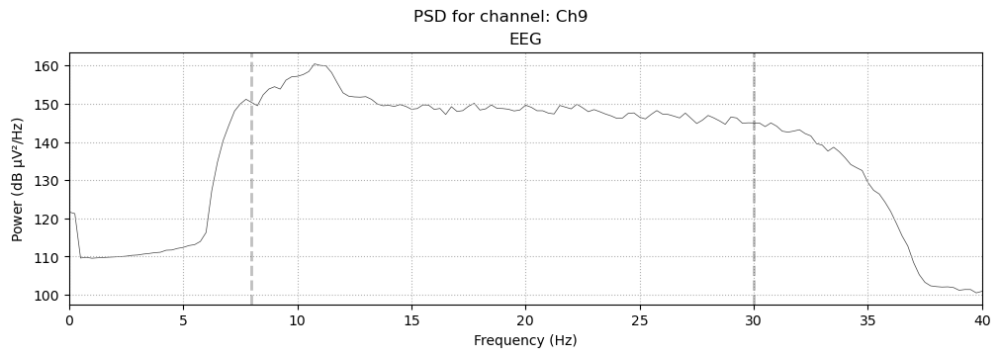

Plotting PSD for channel: Ch10
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


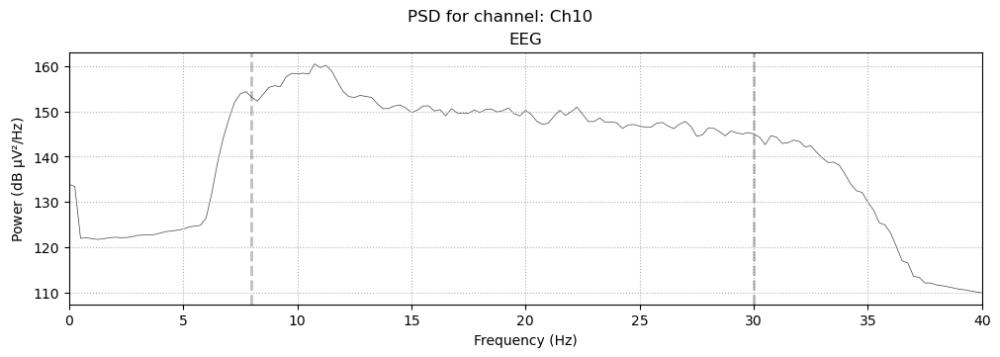

Plotting PSD for channel: Ch11
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


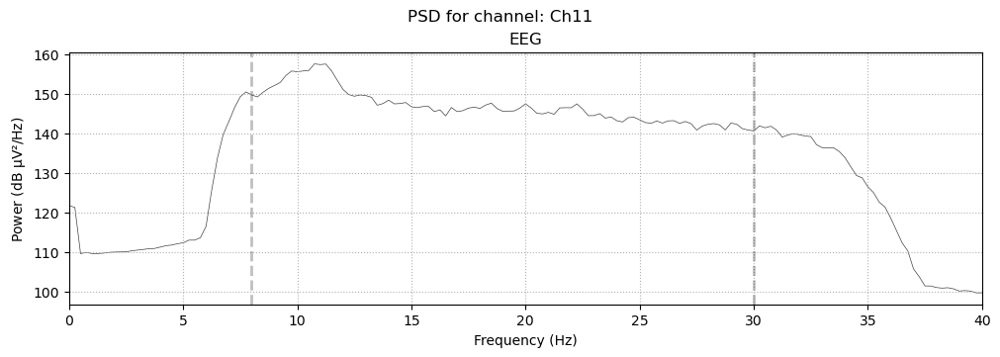

Plotting PSD for channel: Ch12
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


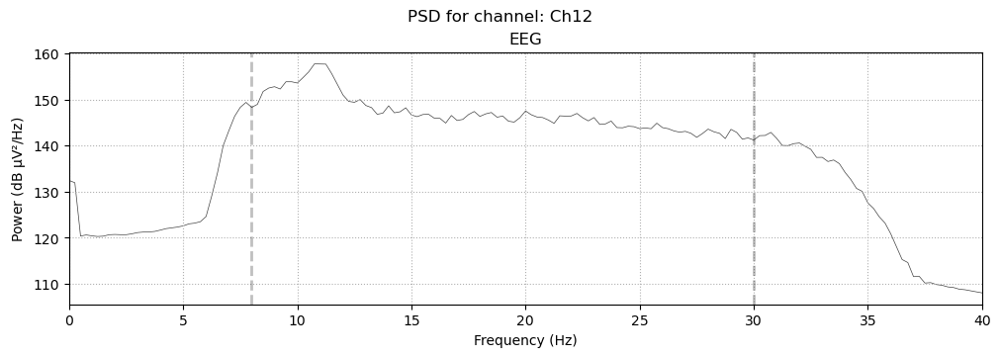

Plotting PSD for channel: Ch13
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


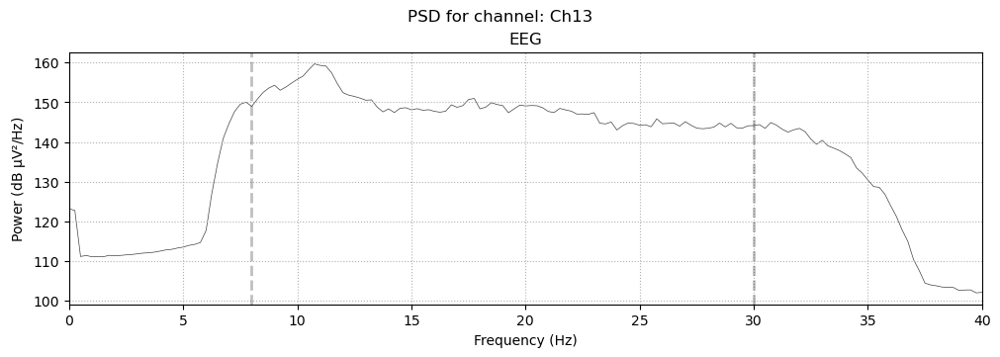

Plotting PSD for channel: Ch14
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


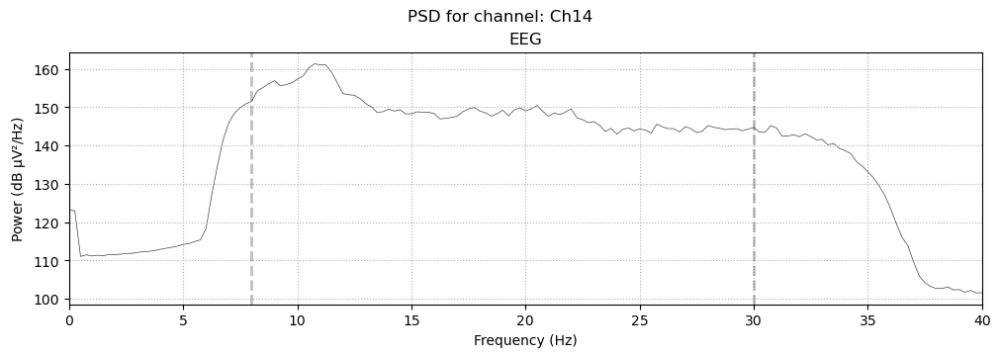

Plotting PSD for channel: Ch15
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


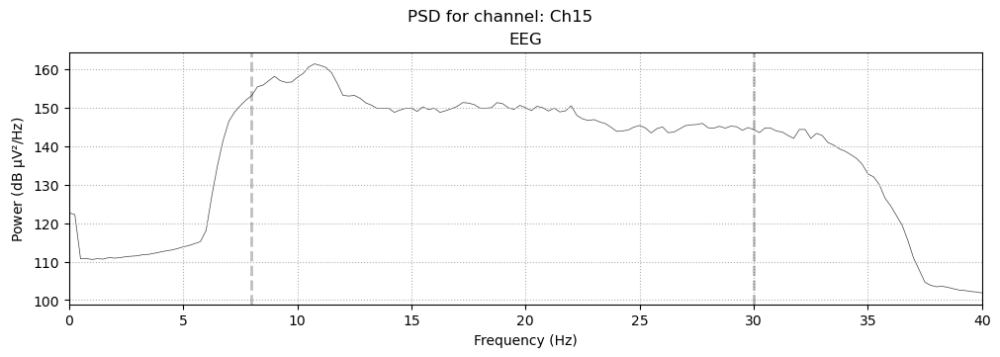

Plotting PSD for channel: Ch16
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


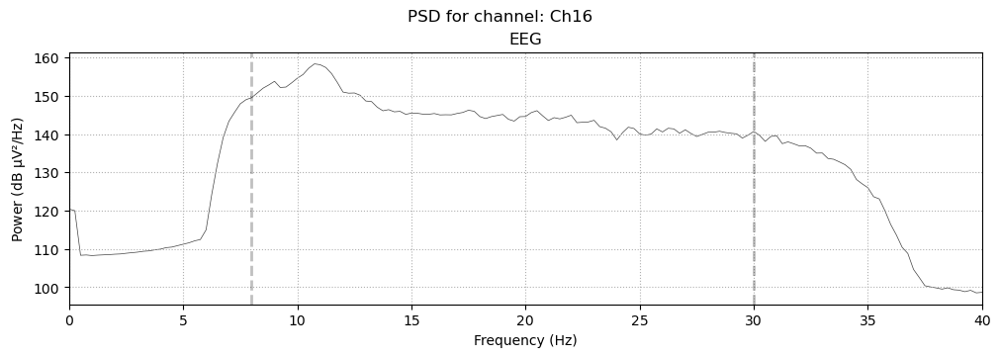

Plotting PSD for channel: Ch17
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


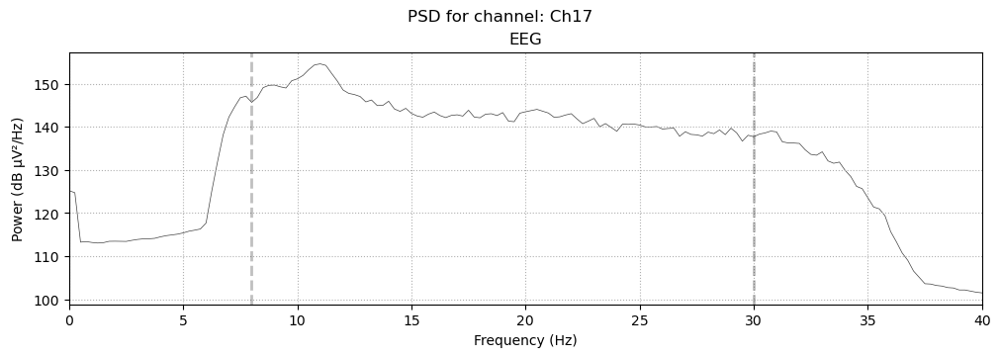

Plotting PSD for channel: Ch18
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


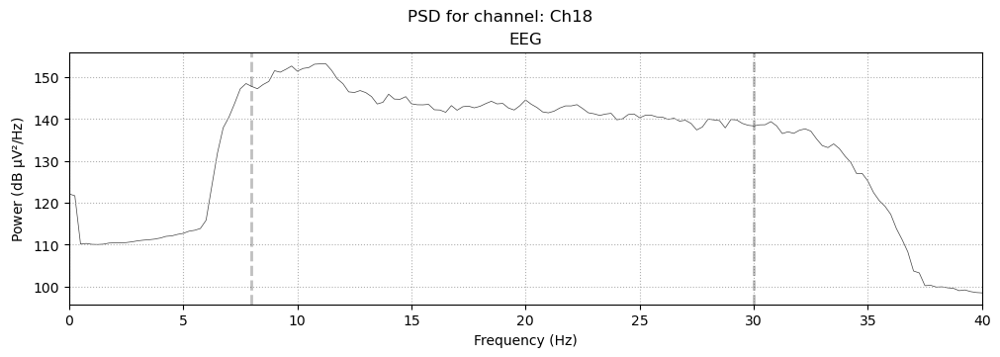

Plotting PSD for channel: Ch19
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


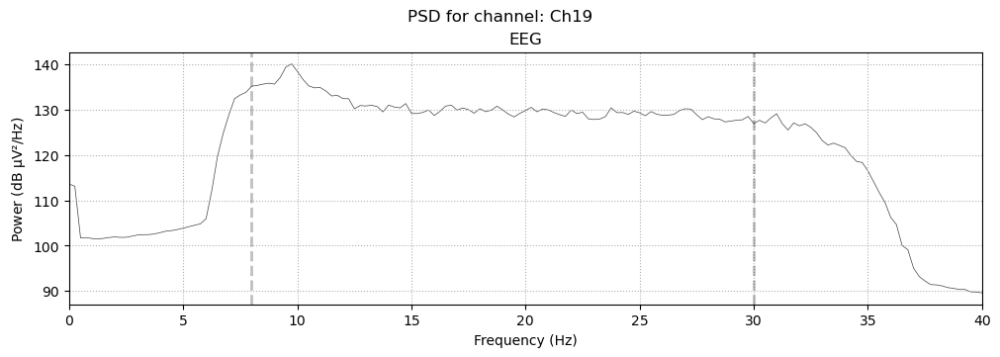

Plotting PSD for channel: Ch20
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


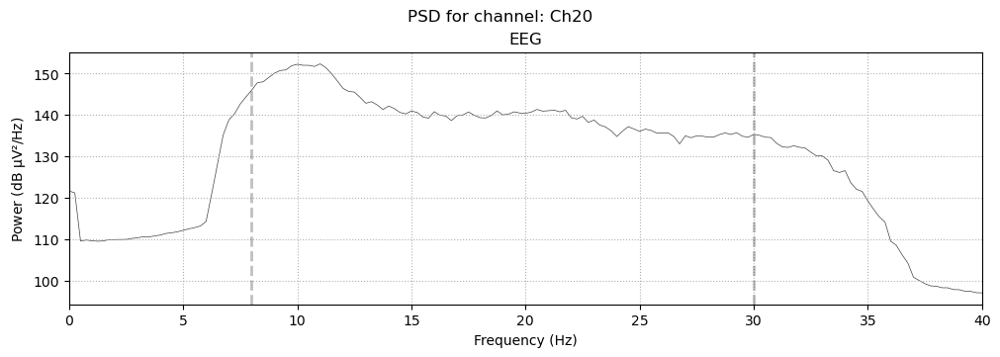

Plotting PSD for channel: Ch21
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


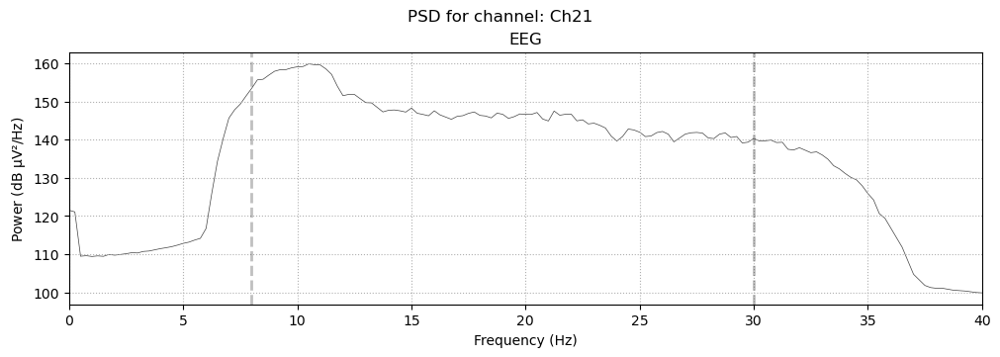

Plotting PSD for channel: Ch22
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


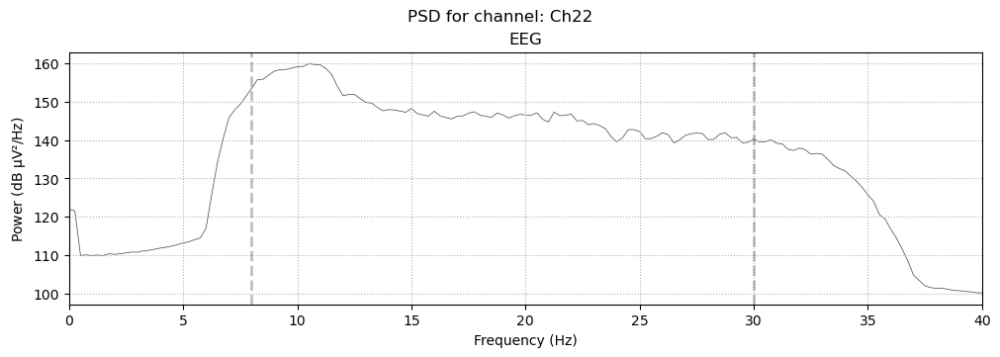

Plotting PSD for channel: Ch23
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


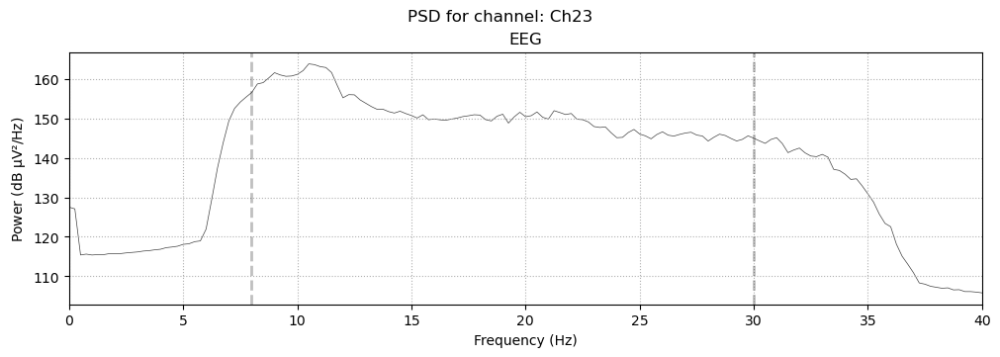

Plotting PSD for channel: Ch24
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


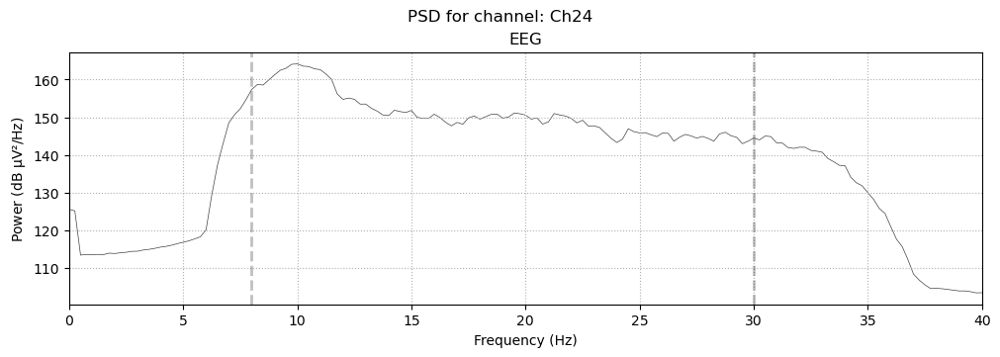

Plotting PSD for channel: Ch25
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


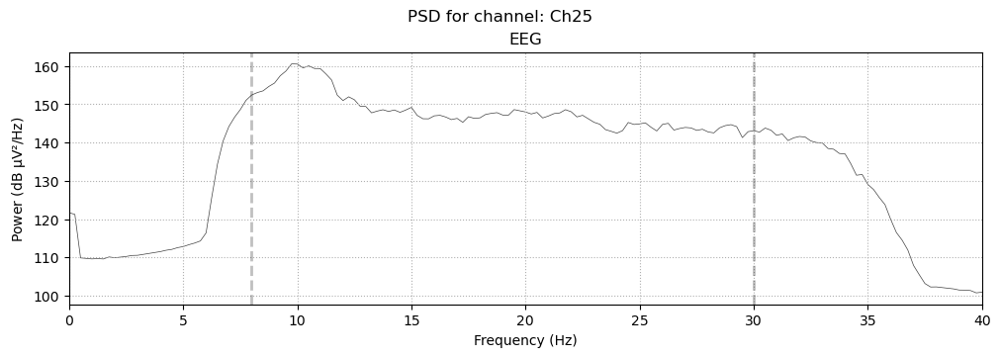

Plotting PSD for channel: Ch26
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


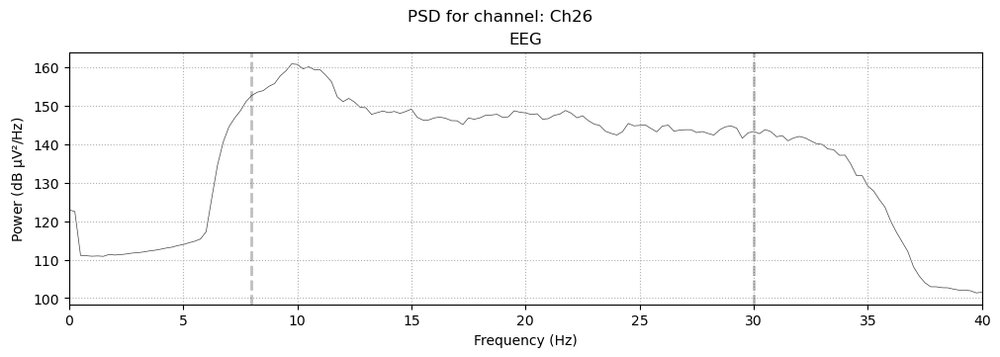

Plotting PSD for channel: Ch27
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


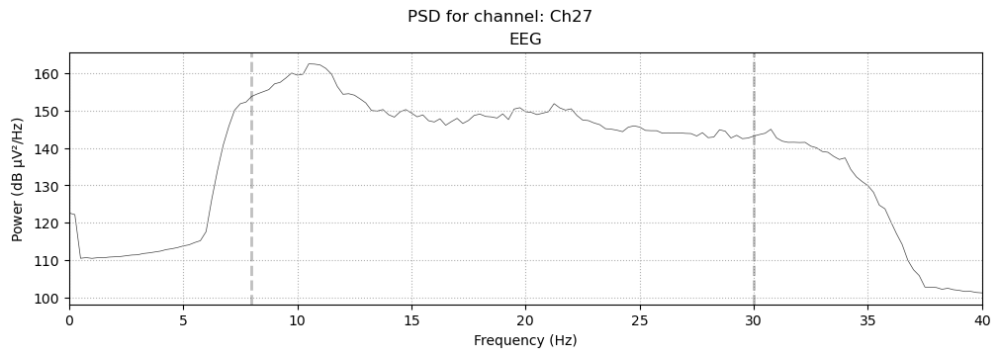

Plotting PSD for channel: Ch28
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


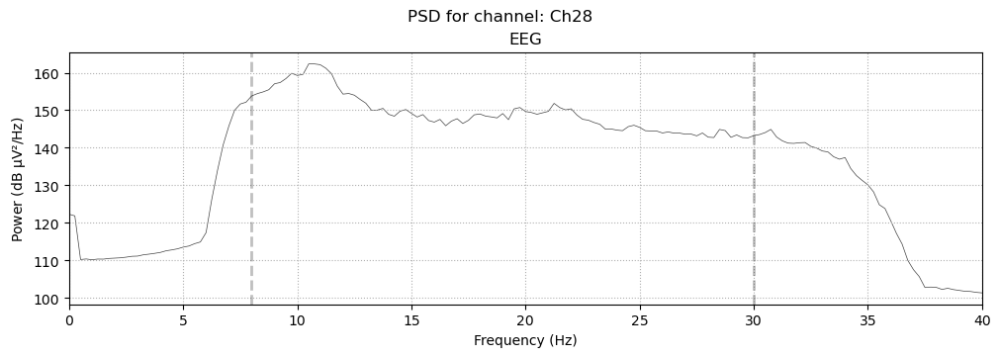

Plotting PSD for channel: Ch29
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


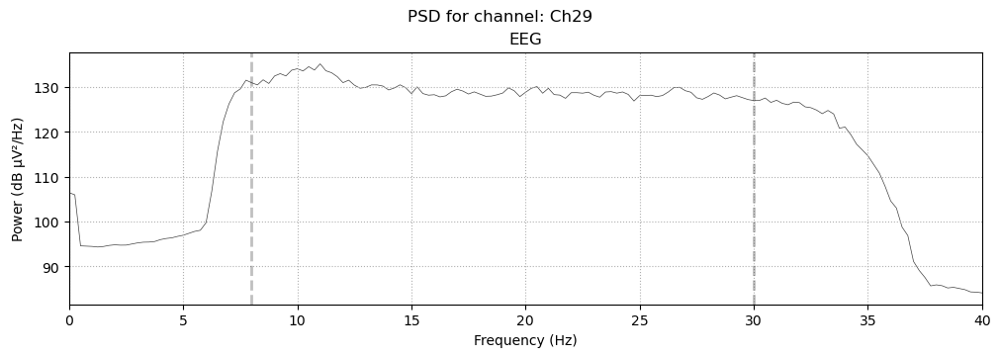

Plotting PSD for channel: Ch30
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


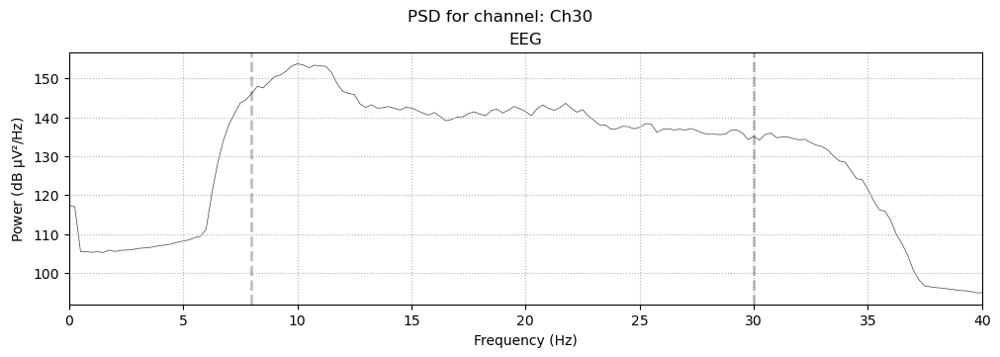

Plotting PSD for channel: Ch31
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


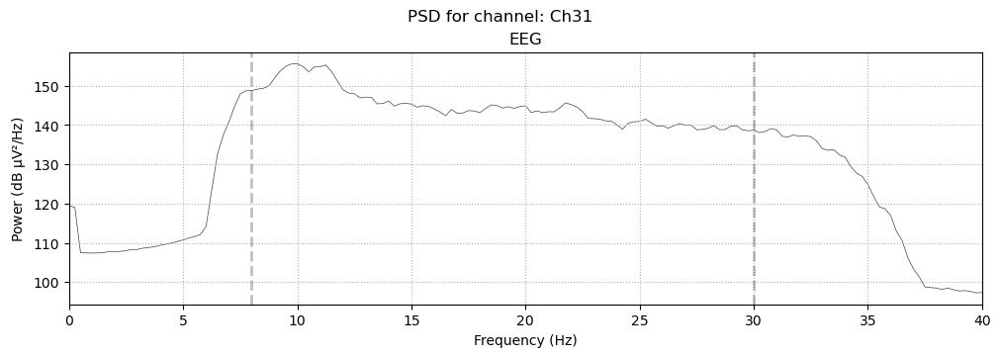

Plotting PSD for channel: Ch32
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


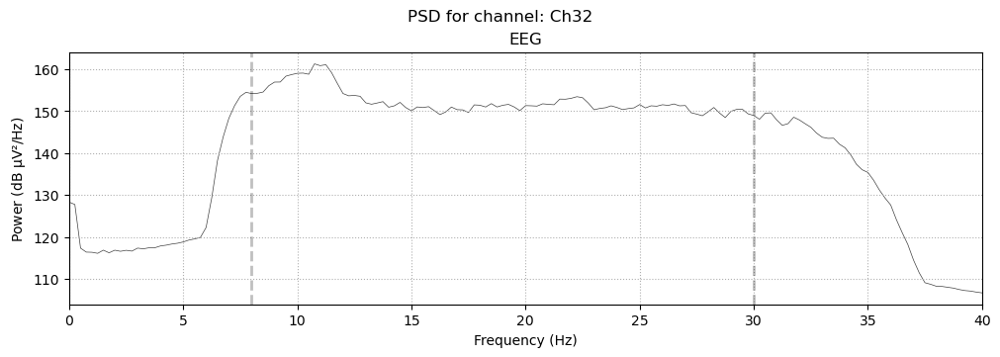

Plotting PSD for channel: Ch33
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 4.000 (s)
Plotting power spectral density (dB=True).


ValueError: picks (NoneNone, treated as "data") yielded no channels, consider passing picks explicitly

In [119]:
import matplotlib.pyplot as plt

for ch in raw_cleaned.info['ch_names']:
    print(f"Plotting PSD for channel: {ch}")
    
    # Plot PSD for the current channel; 'show=False' lets us add a title before displaying
    fig = raw_cleaned.plot_psd(picks=[ch], fmin=0, fmax=40, show=False)
    fig.suptitle(f"PSD for channel: {ch}")
    
    plt.show()


In [28]:
# Get indices where events occur
event_indices = np.where(movement_event[0] > 0)[0]  # Find nonzero events

# Extract event codes from `movement_event`
event_codes = movement_event[0,event_indices]  # Get corresponding event labels

# Create MNE-compatible events array
events = np.column_stack((event_indices, np.zeros(len(event_indices), dtype=int), event_codes.astype(int)))

# Print extracted events
print(events[:10])  # Show first 10 events

[[ 1023     0     1]
 [ 4607     0     1]
 [ 8191     0     1]
 [11775     0     1]
 [15359     0     1]
 [18943     0     1]
 [22527     0     1]
 [26111     0     1]
 [29695     0     1]
 [33279     0     1]]


In [29]:
event_id = {'movement': 1}
# Define time range
tmin, tmax = -7.0, 9.0  # Start -7s before, end +9s after
baseline = (-6.0, -4.0)  # Baseline correction period

# Ensure unique event times by removing duplicates after downsampling
unique_event_times, unique_indices = np.unique(events[:, 0], return_index=True)
unique_events = events[unique_indices]
# Update event times to match downsampled EEG data
unique_events[:, 0] = unique_event_times.astype(int)  # Ensure integer indices

# Segment the EEG into epochs
epochs = mne.Epochs(
    raw_cleaned, unique_events, event_id=event_id, tmin=tmin, tmax=tmax,
    baseline=baseline, preload=True
)

print(f"Total epochs: {len(epochs)}")

Not setting metadata
20 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 20 events and 8193 original time points ...
2 bad epochs dropped
Total epochs: 18


In [30]:
from mne.time_frequency import tfr_morlet

# Define frequency range and wavelet settings
freqs = np.arange(8, 31, 1)  # 8–30 Hz (Alpha & Beta bands)
n_cycles = freqs / 2  # Number of cycles per frequency

# Compute time-frequency representation (TFR) using the updated method
tfr = epochs.compute_tfr(method="morlet", freqs=freqs, n_cycles=n_cycles, use_fft=True,  return_itc=False)


In [31]:
# Apply baseline correction (-6s to -4s)
tfr.apply_baseline(baseline=(-6, -4), mode="percent")

Applying baseline correction (mode: percent)


Data type,Power Estimates
Data source,Epochs
Number of epochs,18
Dims,"epoch, channel, freq, time"
Estimation method,morlet
Number of channels,60
Number of timepoints,8193
Number of frequency bins,23
Frequency range,8.00 – 30.00 Hz


No baseline correction applied


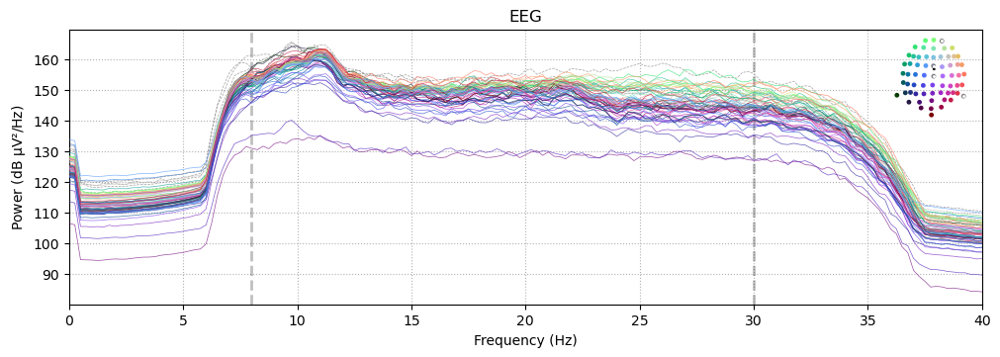

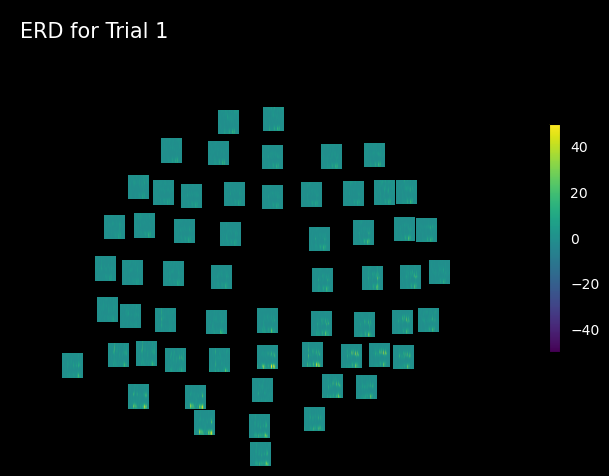

In [32]:
# Select the first epoch for visualization
tfr_single_epoch = tfr[0]  # Select first trial

# Plot ERD for this trial
tfr_single_epoch.plot_topo(title="ERD for Trial 1", vmin=-50, vmax=50)
plt.show()

No baseline correction applied


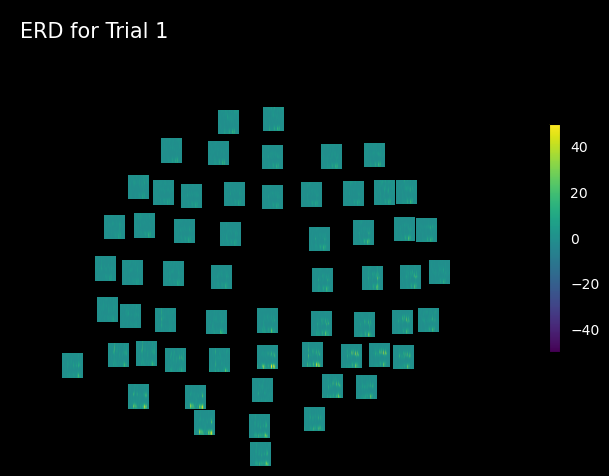

No baseline correction applied


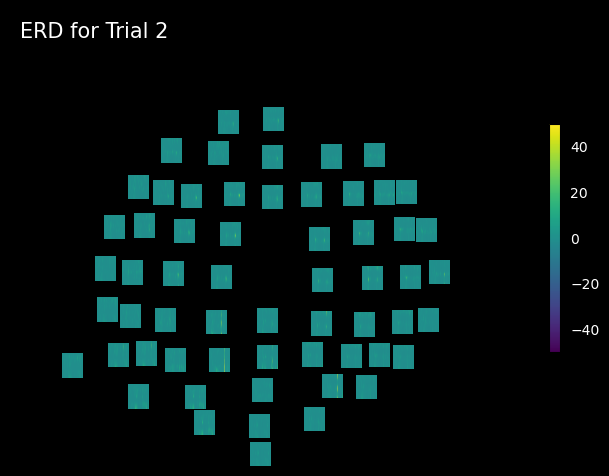

No baseline correction applied


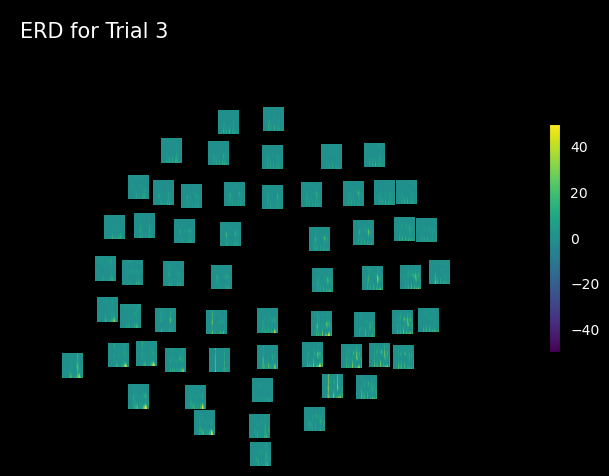

No baseline correction applied


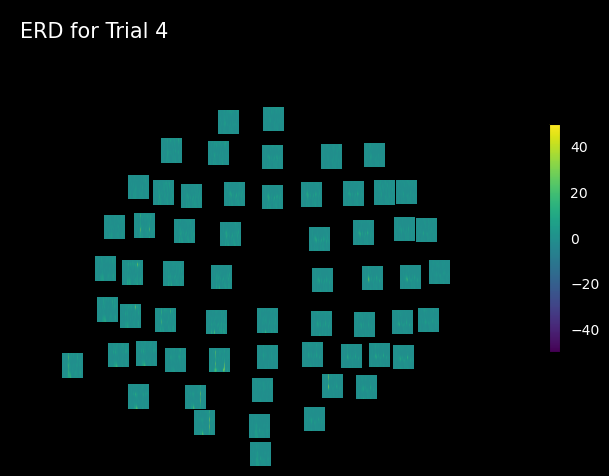

No baseline correction applied


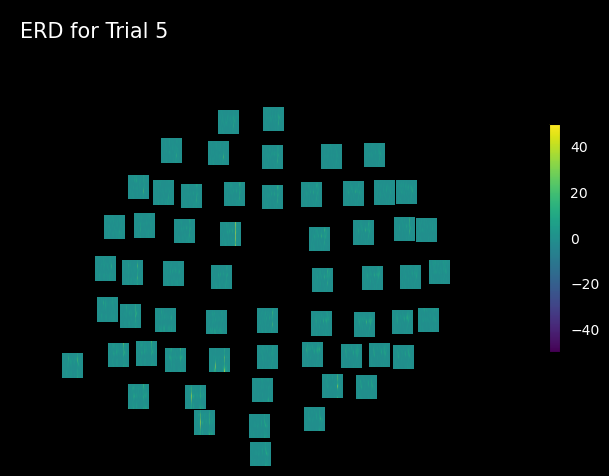

No baseline correction applied


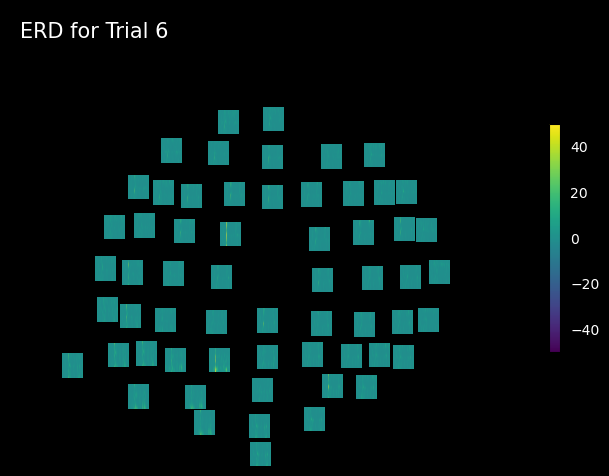

No baseline correction applied


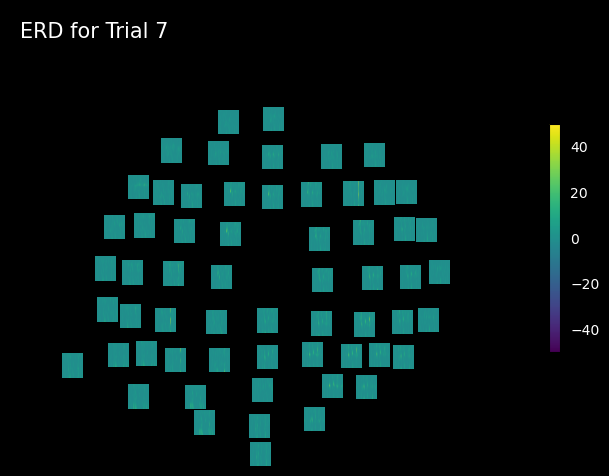

No baseline correction applied


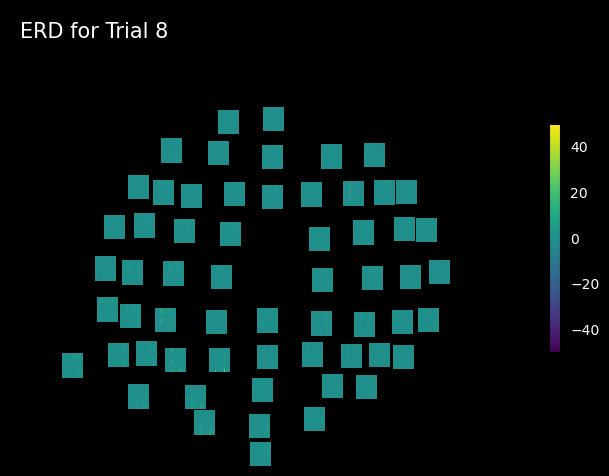

No baseline correction applied


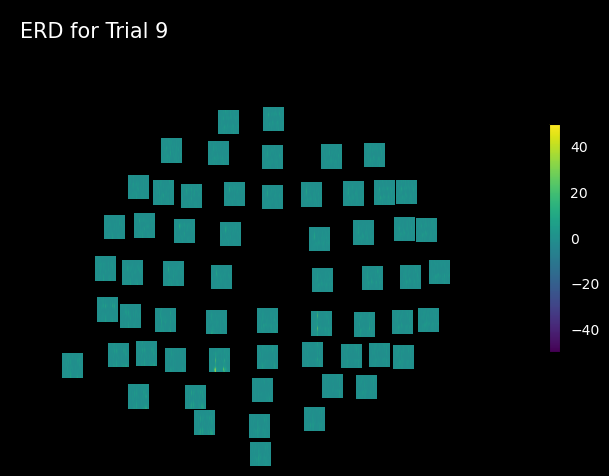

No baseline correction applied


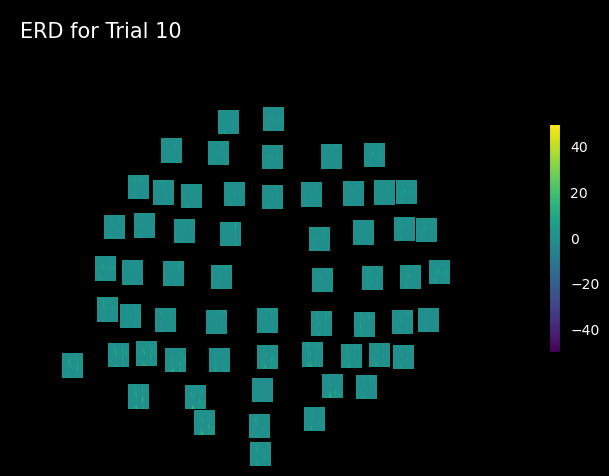

No baseline correction applied


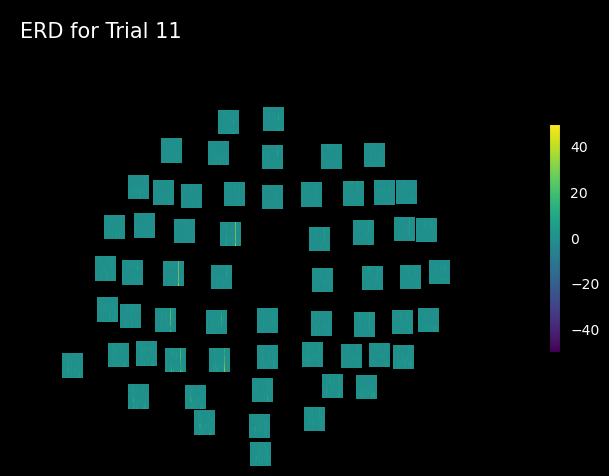

No baseline correction applied


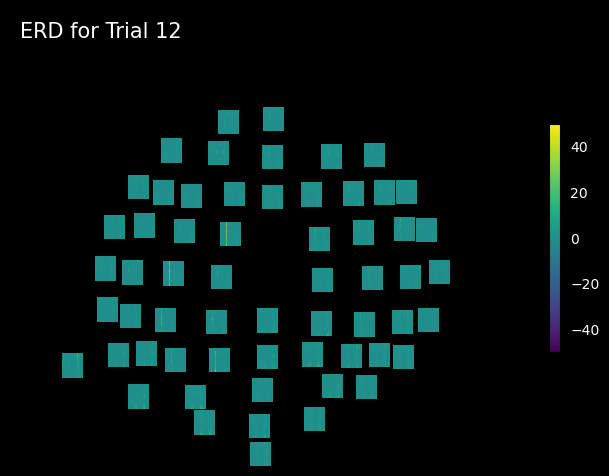

No baseline correction applied


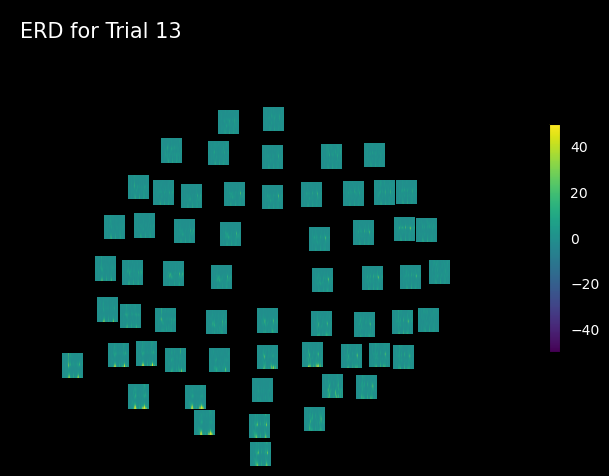

No baseline correction applied


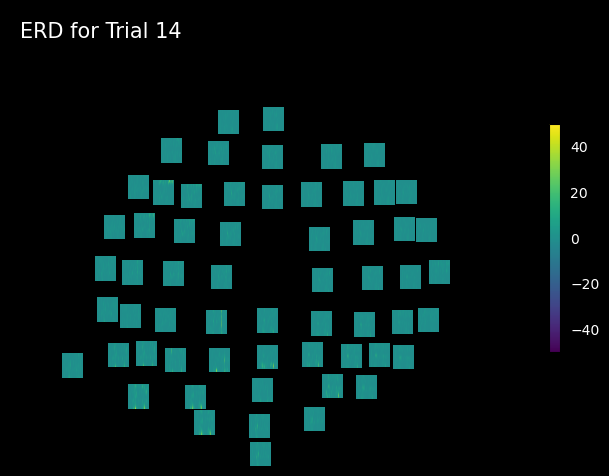

No baseline correction applied


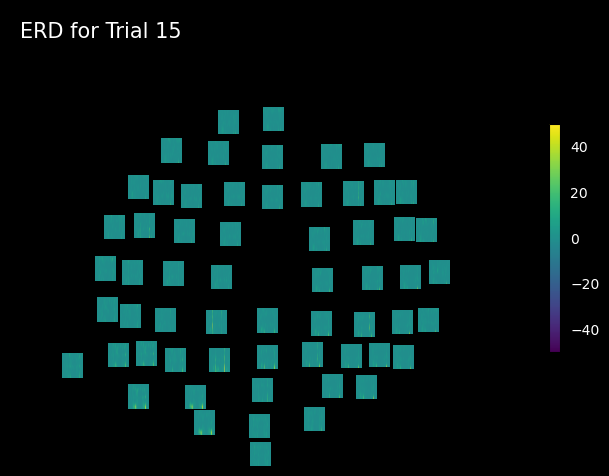

No baseline correction applied


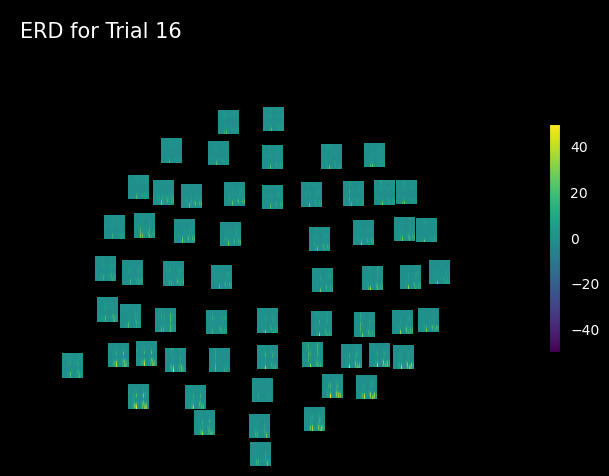

No baseline correction applied


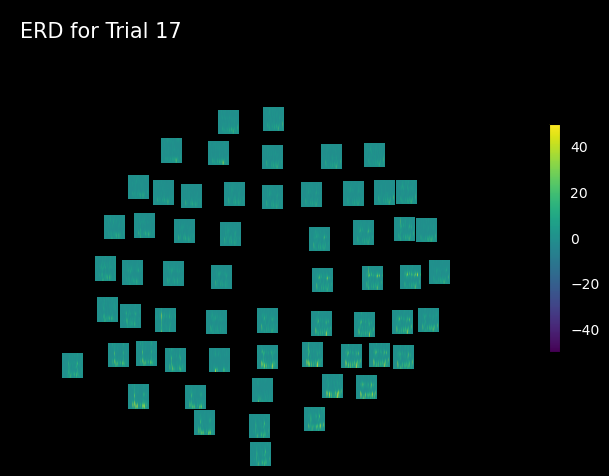

No baseline correction applied


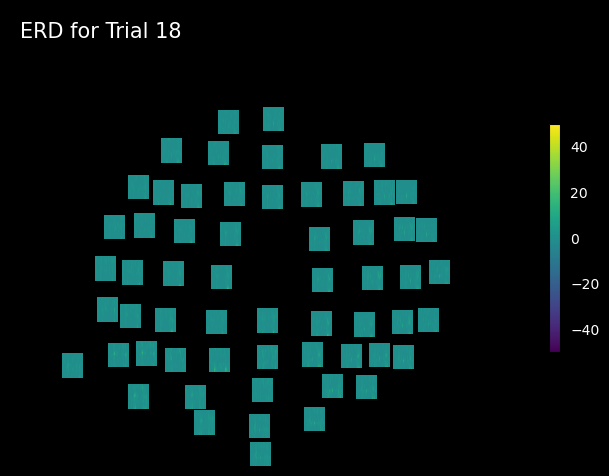

In [60]:
import matplotlib.pyplot as plt

for i in range(len(tfr)):
    tfr_single_epoch= tfr[i]

    # Plot the time-frequency representation for the trial
    tfr_single_epoch.plot_topo(title=f"ERD for Trial {i+1}", vmin=-50, vmax=50)
    plt.show()




In [56]:
print(f"TFR shape: {tfr.data.shape}")  # Expected: (n_epochs, n_channels, n_frequencies, n_times)


TFR shape: (18, 60, 23, 8193)


Averaging all epochs

Averaged TFR shape: (60, 23, 8193)
No baseline correction applied


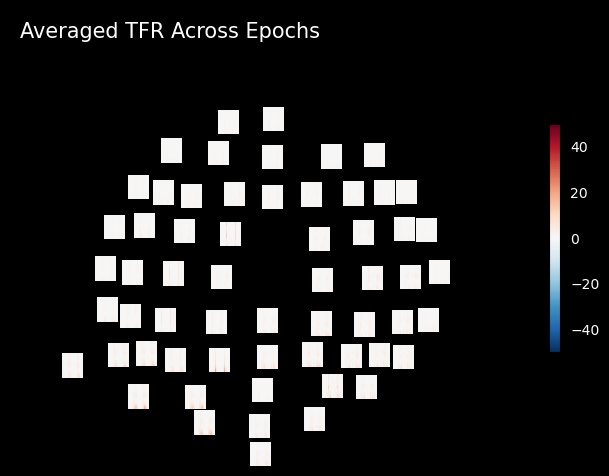

In [82]:
# Average the TFR across epochs
tfr_avg = tfr.average()

print("Averaged TFR shape:", tfr_avg.data.shape)

tfr_avg.plot_topo(title="Averaged TFR Across Epochs", vmin=-50, vmax=50)
plt.show()

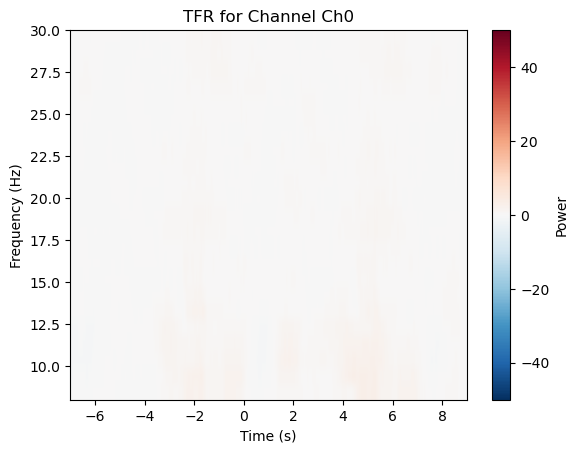

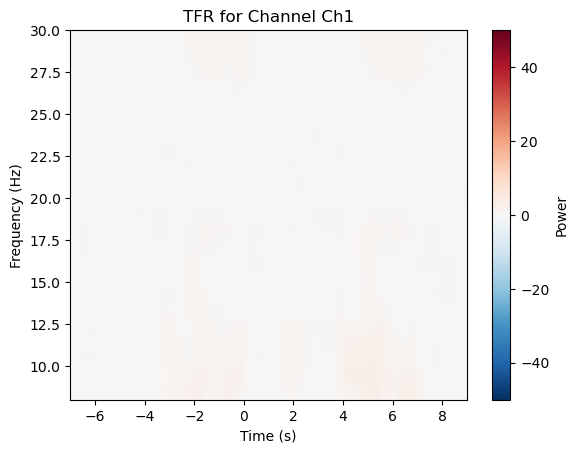

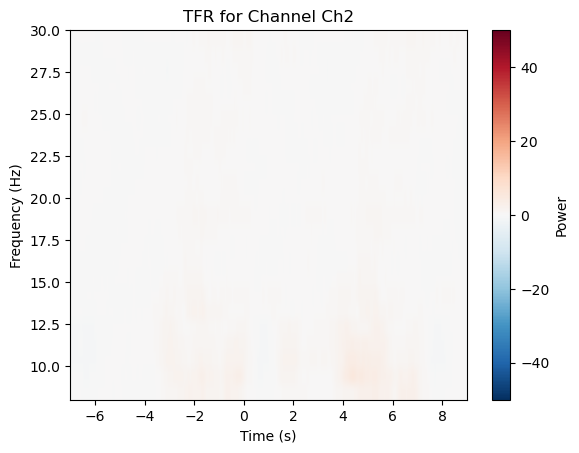

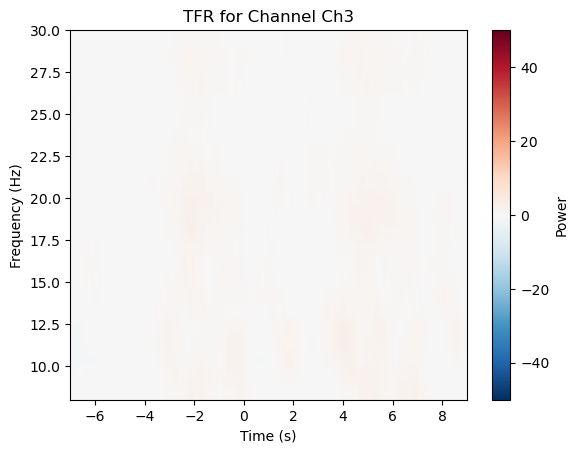

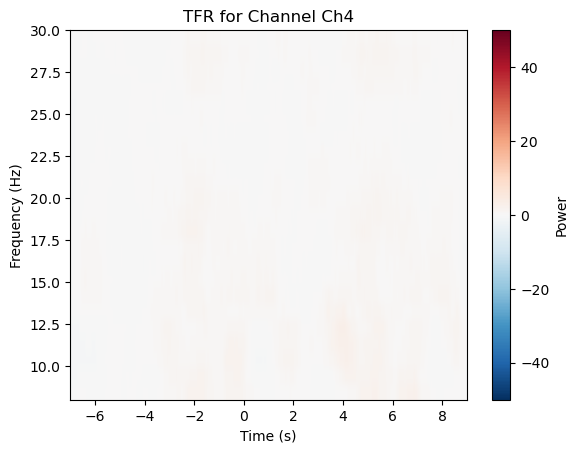

...

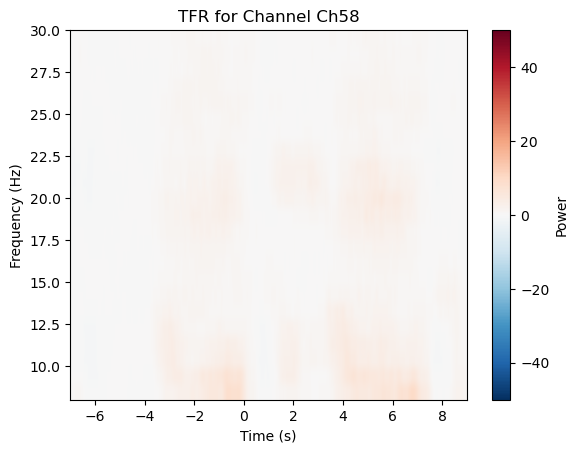

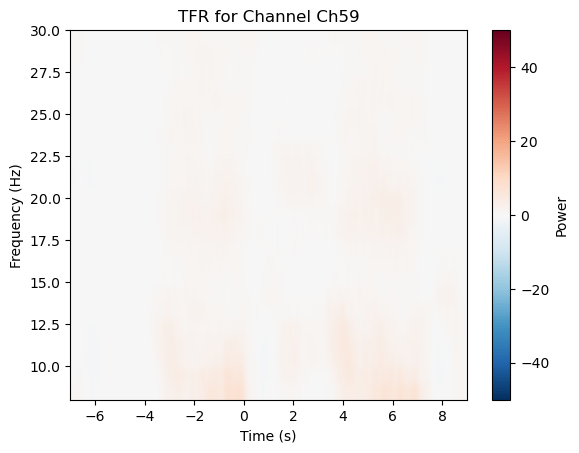

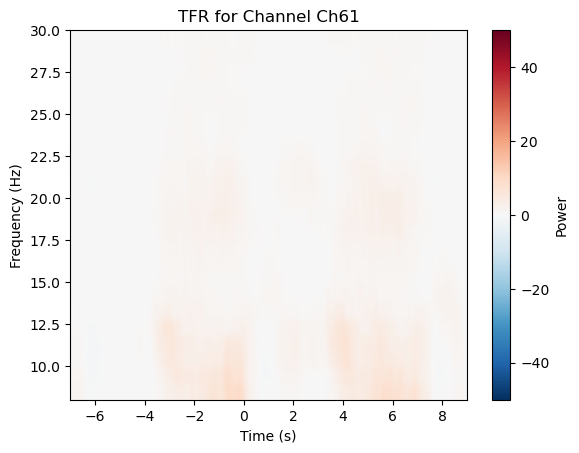

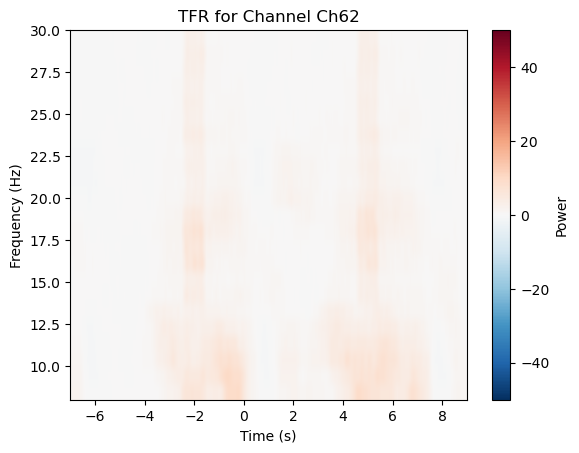

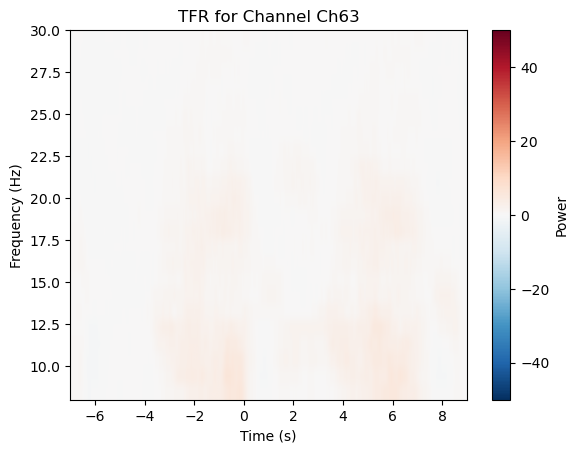

In [95]:
import matplotlib.pyplot as plt

# Loop over each channel
for ch_idx, ch in enumerate(tfr_avg.ch_names):

    data = tfr_avg.data[ch_idx] 
    times = tfr_avg.times   
    freqs = tfr_avg.freqs   
    
    extent = [times[0], times[-1], freqs[0], freqs[-1]]
    
    fig, ax = plt.subplots()
    im = ax.imshow(data, aspect='auto', extent=extent, origin='lower', cmap='RdBu_r')
    
    # Set the color limits
    im.set_clim(-50, 50)
    
    fig.colorbar(im, ax=ax, label='Power')
    ax.set_title(f"TFR for Channel {ch}")
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Frequency (Hz)")
    
    plt.show()
